In [1]:
# Core Python & Utilities
import random
import re
from collections import defaultdict
from itertools import product
from tqdm import tqdm

# Data Handling
import numpy as np
import pandas as pd

# Stats & Modeling
from scipy.optimize import curve_fit
from scipy.stats import sem, t, ttest_ind
from sklearn.cluster import KMeans
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import shap
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

# Data Viz
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# Preferences
pd.set_option("display.max_columns", None)

# Basic Demo of How it Works

In [2]:
# ------------------------------------------------------------------------------------
# MPR Equation 1: Arousal
# A_t = a * r   (original form)
# Recursive update (running average over time):
# A_t = α * r_t + (1 - α) * A_{t-1}
# where:
#   A_t is arousal at time t
#   a is specific activation (strength of reinforcer)
#   r_t is rate of reinforcement at time t (either 0 or 1)
#   α is the learning rate / smoothing factor (0 < α < 1)
# ------------------------------------------------------------------------------------
def update_arousal(prev_arousal: float, reinforcement: int, alpha: float, a: float) -> float:
    """Update arousal based on previous value and new reinforcement event"""
    return alpha * (a * reinforcement) + (1 - alpha) * prev_arousal

# ------------------------------------------------------------------------------------
# MPR Equation 2b: Response Constraint
# b_total = (1 / δ) * (A / (1 + A))
# where:
#   b_total is the total rate of behavior (target + competing responses)
#   δ is the duration of a response
#   A is current arousal
# ------------------------------------------------------------------------------------
def compute_total_response_rate(A: float, delta: float) -> float:
    """Compute total response rate given arousal and motor constraint"""
    return (1 / delta) * (A / (1 + A))


# ------------------------------------------------------------------------------------
# MPR Equation 7: Direction/Coupling
# b_target = C * (1 / δ) * (A / (1 + A))
# where:
#   b_target is the rate of the target response (e.g., lever press)
#   C is the coupling coefficient, representing directional control (0 to 1)
# ------------------------------------------------------------------------------------
def compute_target_response_rate(A: float, delta: float, coupling: float) -> float:
    """Compute target response rate based on arousal and coupling"""
    return coupling * (1 / delta) * (A / (1 + A))


# ------------------------------------------------------------------------------------
# Coupling update (based on blocking/proximity principles):
# C_t = C_{t-1} + η * (proximity - C_{t-1})
# where:
#   η is the learning rate
#   proximity = 1 if reinforced, 0.1 if not (we assume low proximity when no reinforcement)
# ------------------------------------------------------------------------------------
def update_coupling(prev_coupling: float, was_reinforced: bool, learning_rate: float = 0.05, proximity: float = 1.0) -> float:
    """Update coupling coefficient based on reinforcement outcome"""
    target = proximity if was_reinforced else 0.1
    return prev_coupling + learning_rate * (target - prev_coupling)


# ------------------------------------------------------------------------------------
# Wrapper for a single update step
# Inputs:
#   prev_arousal: current arousal level
#   prev_coupling: current coupling strength
#   reinforcement: 1 or 0
#   a: specific activation (magnitude of reinforcer)
#   delta: duration of a response
#   alpha: learning rate for arousal
#   eta: learning rate for coupling
# Outputs:
#   updated A, C, total response rate, target response rate
# ------------------------------------------------------------------------------------
def update_step(prev_arousal, prev_coupling, reinforcement, a, delta, alpha=0.1, eta=0.05):
    """Run one update of arousal, coupling, and response rates"""
    A = update_arousal(prev_arousal, reinforcement, alpha, a)  # now includes a
    C = update_coupling(prev_coupling, was_reinforced=bool(reinforcement), learning_rate=eta)
    b_total = compute_total_response_rate(A, delta)
    b_target = compute_target_response_rate(A, delta, C)
    return A, C, b_total, b_target


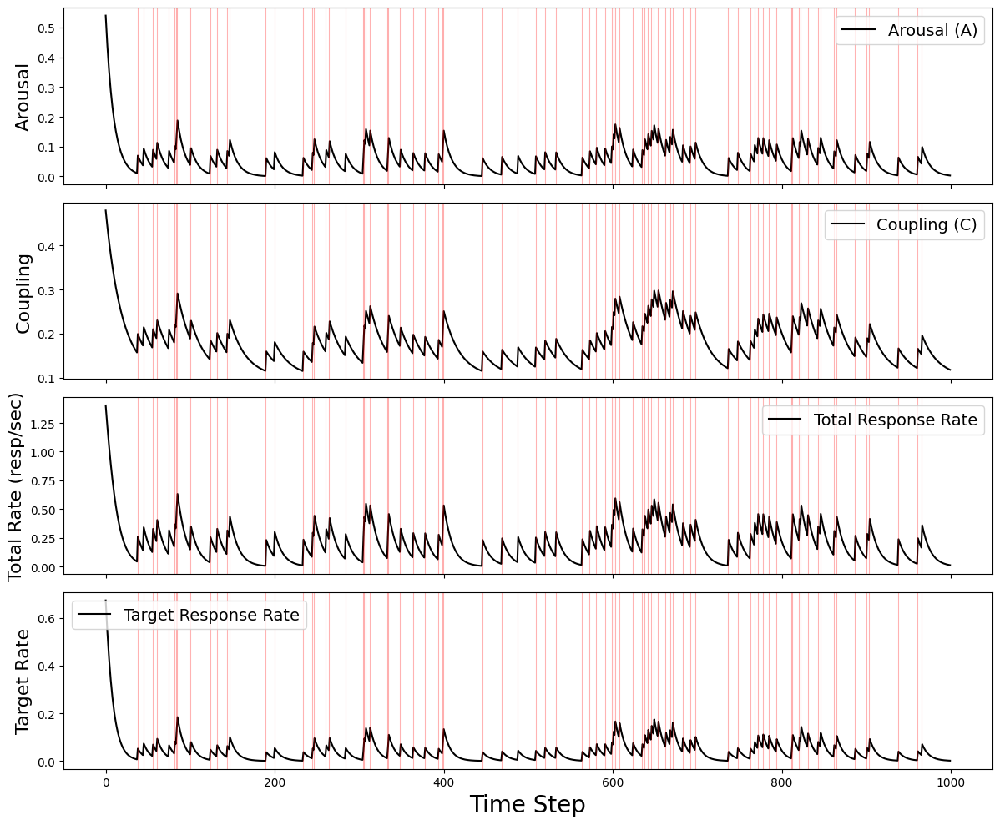

In [3]:
# Parameters
num_steps = 1000
delta = 0.25         # response duration (sec)
a = 0.6              # specific activation (motivational level)
alpha = 0.1          # learning rate for arousal
eta = 0.05           # learning rate for coupling
vr_n = 10             # VR-5 schedule: 1 in 5 chance of reinforcement per step

# Initialize state
A = 0.6              # start with moderate arousal
C = 0.5              # start with medium coupling
arousal_history = []
coupling_history = []
b_total_history = []
b_target_history = []
reinforcement_history = []

# Simulation loop
for t in range(num_steps):
    # simulate probabilistic reinforcement (VR schedule)
    reinforcement = np.random.rand() < (1 / vr_n)

    # update arousal, coupling, and response rates
    A, C, b_total, b_target = update_step(A, C, reinforcement, a, delta, alpha, eta)

    # record
    arousal_history.append(A)
    coupling_history.append(C)
    b_total_history.append(b_total)
    b_target_history.append(b_target)
    reinforcement_history.append(reinforcement)

# Plotting
fig, axs = plt.subplots(4, 1, figsize=(12, 10), sharex=True)

# Get times where reinforcement occurred
reinforced_times = [i for i, r in enumerate(reinforcement_history) if r == 1]

# Function to add vertical lines at correct time steps
def add_reinforcement_lines(ax):
    for rt in reinforced_times:
        ax.axvline(x=rt - 0.5, color='red', alpha=0.3, linewidth=0.8)  # Shift back by 0.5 to align with event

# Arousal
axs[0].plot(arousal_history, color='k', label="Arousal (A)")
add_reinforcement_lines(axs[0])
axs[0].set_ylabel("Arousal", fontsize=16)
axs[0].legend(fontsize=14)

# Coupling
axs[1].plot(coupling_history, color='k', label="Coupling (C)")
add_reinforcement_lines(axs[1])
axs[1].set_ylabel("Coupling", fontsize=16)
axs[1].legend(fontsize=14)

# Total response rate
axs[2].plot(b_total_history, color='k', label="Total Response Rate")
add_reinforcement_lines(axs[2])
axs[2].set_ylabel("Total Rate (resp/sec)", fontsize=16)
axs[2].legend(fontsize=14)

# Target response rate
axs[3].plot(b_target_history, color='k', label="Target Response Rate")
add_reinforcement_lines(axs[3])
axs[3].set_ylabel("Target Rate", fontsize=16)
axs[3].legend(fontsize=14)

axs[3].set_xlabel("Time Step", fontsize=20)

plt.tight_layout()
plt.show()


# A Range of Single VR Schedule

In [4]:
import numpy as np
import pandas as pd
from itertools import product
from tqdm import tqdm
from scipy.stats import sem, t

# --- MPR Model Functions ---
def update_arousal(prev_arousal: float, reinforcement: int, alpha: float, a: float) -> float:
    return alpha * (a * reinforcement) + (1 - alpha) * prev_arousal

def compute_total_response_rate(A: float, delta: float) -> float:
    return (1 / delta) * (A / (1 + A))

def compute_target_response_rate(A: float, delta: float, coupling: float) -> float:
    return coupling * (1 / delta) * (A / (1 + A))

def update_coupling(prev_coupling: float, was_reinforced: bool, learning_rate: float, proximity: float = 1.0) -> float:
    target = proximity if was_reinforced else 0.1
    return prev_coupling + learning_rate * (target - prev_coupling)

def update_step(prev_arousal, prev_coupling, reinforcement, a, delta, alpha, eta):
    A = update_arousal(prev_arousal, reinforcement, alpha, a)
    C = update_coupling(prev_coupling, was_reinforced=bool(reinforcement), learning_rate=eta)
    b_total = compute_total_response_rate(A, delta)
    b_target = compute_target_response_rate(A, delta, C)
    return A, C, b_total, b_target

# --- Confidence Interval ---
def ci95(data):
    n = len(data)
    return sem(data) * t.ppf(0.975, n - 1)

# --- Main Simulation Function ---
def simulate_mpr_sequence(vr_schedule_list, a, delta, alpha, eta, ao_id, steps_per_schedule=1000):
    A, C = 0.6, 0.5  # Initial internal state
    all_results = []

    for vr_idx, vr in enumerate(vr_schedule_list):
        A_hist, C_hist, bt_hist, bp_hist = [], [], [], []

        for _ in range(steps_per_schedule):
            reinforcement = np.random.rand() < (1 / vr)
            A, C, b_total, b_target = update_step(A, C, reinforcement, a, delta, alpha, eta)
            A_hist.append(A)
            C_hist.append(C)
            bt_hist.append(b_total)
            bp_hist.append(b_target)

        all_results.append({
            'AO_id': ao_id,
            'vr_sequence_index': vr_idx,
            'VR': vr,
            'arousal_avg': np.mean(A_hist),
            'arousal_min': np.min(A_hist),
            'arousal_max': np.max(A_hist),
            'arousal_ci': ci95(A_hist),
            'coupling_avg': np.mean(C_hist),
            'coupling_min': np.min(C_hist),
            'coupling_max': np.max(C_hist),
            'coupling_ci': ci95(C_hist),
            'b_total_avg': np.mean(bt_hist),
            'b_total_min': np.min(bt_hist),
            'b_total_max': np.max(bt_hist),
            'b_total_ci': ci95(bt_hist),
            'b_target_avg': np.mean(bp_hist),
            'b_target_min': np.min(bp_hist),
            'b_target_max': np.max(bp_hist),
            'b_target_ci': ci95(bp_hist),
            'activation': a,
            'delta': delta,
            'alpha': alpha,
            'eta': eta,
        })

    return all_results

# --- Parameter Grid ---
deltas = [0.25, 0.50, 1.0, 2.0]
activations = [0.1, 0.2, 0.4, 0.8, 1.6]
alphas = [0.01, 0.03, 0.1, 0.3, 1.0]
etas = [0.01, 0.03, 0.3, 1.0]
vr_schedules = [1, 3, 10, 30, 100, 300, 1000]

# --- Grid Search Over AO Parameter Combinations ---
results = []
grid = list(product(activations, deltas, alphas, etas))

for ao_id, (a, delta, alpha, eta) in enumerate(tqdm(grid, desc="Running simulations per AO")):
    shuffled_vrs = np.random.permutation(vr_schedules)
    sim_result_list = simulate_mpr_sequence(
        vr_schedule_list=shuffled_vrs,
        a=a,
        delta=delta,
        alpha=alpha,
        eta=eta,
        ao_id=ao_id
    )
    results.extend(sim_result_list)

# --- Final Results DataFrame ---
results_df = pd.DataFrame(results)

# Sample Output
results_df

Running simulations per AO: 100%|██████████| 400/400 [00:44<00:00,  9.08it/s]


,AO_id,vr_sequence_index,VR,arousal_avg,arousal_min,arousal_max,arousal_ci,coupling_avg,coupling_min,coupling_max,coupling_ci,b_total_avg,b_total_min,b_total_max,b_total_ci,b_target_avg,b_target_min,b_target_max,b_target_ci,activation,delta,alpha,eta
0,0,0,1,0.149498,0.100022,0.595000,6.165828e-03,0.950502,0.505000,0.999978,0.006166,0.498632,0.363708,1.492163,1.557839e-02,0.449135,0.363700,0.806896,8.456957e-03,0.1,0.25,0.01,0.01
1,0,1,300,0.010124,0.000008,0.099021,1.228692e-03,0.191092,0.100075,0.990979,0.011056,0.038640,0.000033,0.360398,4.592922e-03,0.020553,0.000003,0.357147,3.499529e-03,0.1,0.25,0.01,0.01
2,0,2,100,0.000697,0.000019,0.002307,3.128447e-05,0.106276,0.100172,0.120761,0.000282,0.002786,0.000077,0.009206,1.249306e-04,0.000305,0.000008,0.001112,1.437479e-05,0.1,0.25,0.01,0.01
3,0,3,3,0.033054,0.000811,0.042457,4.928778e-04,0.397488,0.107300,0.482112,0.004436,0.127754,0.003242,0.162911,1.875522e-03,0.052939,0.000348,0.078541,1.065373e-03,0.1,0.25,0.01,0.01
4,0,4,1000,0.003726,0.000009,0.035269,4.465624e-04,0.133534,0.100078,0.417419,0.004019,0.014648,0.000035,0.136269,1.741781e-03,0.003772,0.000003,0.056881,5.896975e-04,0.1,0.25,0.01,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2795,399,2,1,1.600000,1.600000,1.600000,1.378580e-17,1.000000,1.000000,1.000000,0.000000,0.307692,0.307692,0.307692,6.892901e-18,0.307692,0.307692,0.307692,6.892901e-18,1.6,2.00,1.00,1.00
2796,399,3,300,0.006400,0.000000,1.600000,6.270057e-03,0.103600,0.100000,1.000000,0.003527,0.001231,0.000000,0.307692,1.205780e-03,0.001231,0.000000,0.307692,1.205780e-03,1.6,2.00,1.00,1.00
2797,399,4,1000,0.001600,0.000000,1.600000,3.139746e-03,0.100900,0.100000,1.000000,0.001766,0.000308,0.000000,0.307692,6.037974e-04,0.000308,0.000000,0.307692,6.037974e-04,1.6,2.00,1.00,1.00
2798,399,5,3,0.542400,0.000000,1.600000,4.702322e-02,0.405100,0.100000,1.000000,0.026451,0.104308,0.000000,0.307692,9.042928e-03,0.104308,0.000000,0.307692,9.042928e-03,1.6,2.00,1.00,1.00


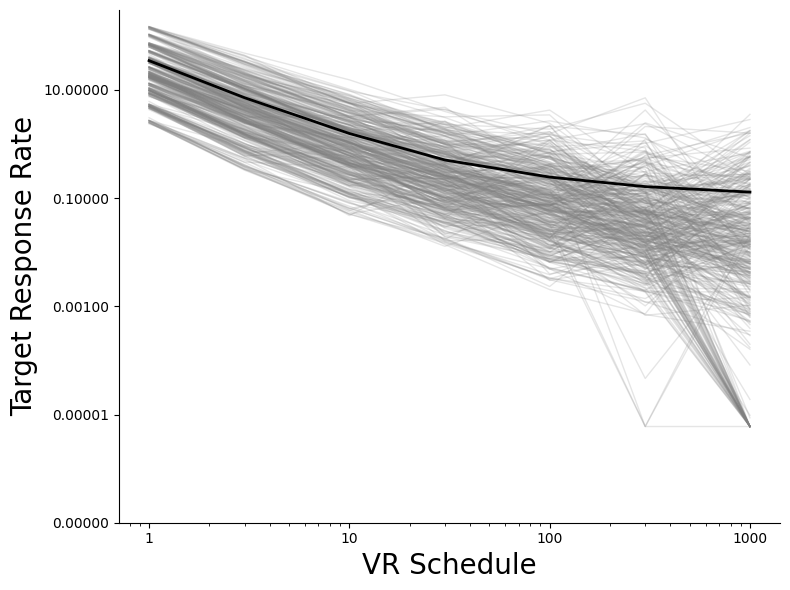

In [5]:
# Sort the data so each AO's line is plotted in VR sequence order
results_df_sorted = results_df.sort_values(['AO_id', 'VR'])
results_df_sorted['b_target_avg'] = results_df_sorted['b_target_avg'].clip(lower=0.0000001)
results_df_sorted['b_target_avg'] = results_df_sorted['b_target_avg']*60

# Set up the figure
fig, ax = plt.subplots(figsize=(8, 6))

# Plot each AO's line
for _, ao_data in results_df_sorted.groupby("AO_id"):
    ax.plot(
        ao_data['VR'],
        ao_data['b_target_avg'],
        color='gray',
        alpha=0.2,
        linewidth=1
    )

# Optional: Overlay a central tendency (e.g., median or mean line)
avg_data = results_df_sorted.groupby('VR')['b_target_avg'].mean().reset_index()
sns.lineplot(
    data=avg_data,
    x='VR', y='b_target_avg',
    color='black',
    linewidth=2,
    label='Mean across AOs'
)

# Log scales for both axes
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_ylim(0.000001, 300)
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.5f'))
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.0f'))

# Labels and style
ax.set_ylabel("Target Response Rate", fontsize=20)
ax.set_xlabel("VR Schedule", fontsize=20)
ax.legend().remove()
ax.grid(False)
sns.despine()
plt.tight_layout()
plt.show()

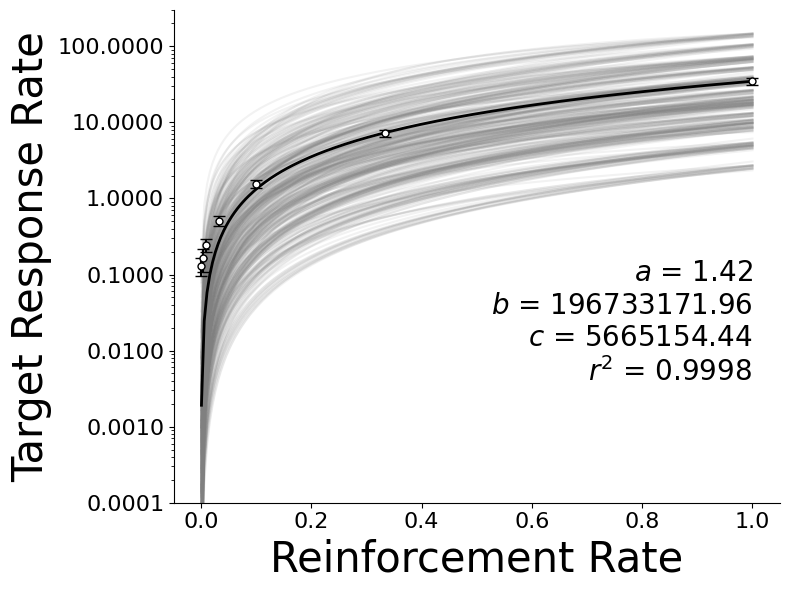

In [6]:
# Compute reinforcement rate
results_df['r'] = 1 / results_df['VR']
results_df['b_target_avg'] = results_df['b_target_avg']*60

# Define generalized hyperbola
def generalized_hyperbola(r, a, b, c):
    return (b * (r ** a)) / (r ** a + c)

# Fit function per AO
def fit_ao_hyperbola(df):
    try:
        popt, _ = curve_fit(
            generalized_hyperbola,
            df['r'],
            df['b_target_avg'],
            p0=[1.0, 1.0, 0.1],
            bounds=(0, np.inf),
            maxfev=10000
        )
        return popt
    except:
        return [np.nan, np.nan, np.nan]

# Fit and store per-AO curves
fit_results = []
ao_curves = []

# Loop over AOs
for ao_id, group in results_df.groupby("AO_id"):
    try:
        # Fit hyperbola
        popt, _ = curve_fit(
            generalized_hyperbola,
            group['r'],
            group['b_target_avg'],
            p0=[1.0, 1.0, 0.1],
            bounds=(0, np.inf),
            maxfev=10000
        )

        # Predict using the fit
        predicted = generalized_hyperbola(group['r'], *popt)

        # Compute R²
        residuals = group['b_target_avg'] - predicted
        ss_res = np.sum(residuals ** 2)
        ss_tot = np.sum((group['b_target_avg'] - np.mean(group['b_target_avg'])) ** 2)
        r_squared = 1 - (ss_res / ss_tot)

        # Store parameters and R²
        fit_results.append({
            'AO_id': ao_id,
            'a': popt[0],
            'b': popt[1],
            'c': popt[2],
            'r_squared': r_squared
        })

        # Store predicted curve
        r_vals = np.linspace(group['r'].min(), group['r'].max(), 200)
        predicted_curve = generalized_hyperbola(r_vals, *popt)
        ao_curves.append(pd.DataFrame({
            'AO_id': ao_id,
            'r': r_vals,
            'predicted_b_target': predicted_curve
        }))

    except:
        continue  # skip AOs that fail to fit

fit_df = pd.DataFrame(fit_results)
curves_df = pd.concat(ao_curves, ignore_index=True)

# Group-level mean and CI
grouped = results_df.groupby('r').agg(
    b_target_avg_mean=('b_target_avg', 'mean'),
    b_target_avg_se=('b_target_avg', sem)
).reset_index()
grouped['b_target_avg_ci'] = grouped['b_target_avg_se'] * t.ppf(0.975, df=len(results_df) - 1)

# Fit group-level curve
popt, _ = curve_fit(
    generalized_hyperbola,
    grouped['r'],
    grouped['b_target_avg_mean'],
    p0=[1.0, 1.0, 0.1],
    bounds=(0, np.inf)
)
r_vals = np.linspace(grouped['r'].min(), grouped['r'].max(), 200)
group_fit = generalized_hyperbola(r_vals, *popt)

# R² calculation for group-level fit
residuals = grouped['b_target_avg_mean'] - generalized_hyperbola(grouped['r'], *popt)
ss_res = np.sum(residuals ** 2)
ss_tot = np.sum((grouped['b_target_avg_mean'] - np.mean(grouped['b_target_avg_mean'])) ** 2)
r_squared = 1 - (ss_res / ss_tot)

# Plot
plt.figure(figsize=(8, 6))

# Plot all individual AO fits
for ao_id, ao_curve in curves_df.groupby("AO_id"):
    plt.plot(ao_curve['r'], ao_curve['predicted_b_target'], alpha=0.1, color='gray')

# Plot group-level fit
plt.plot(r_vals, group_fit, color='black', linewidth=2, label='Group Mean Fit')

# Overlay mean ± CI as white points with black outlines
plt.errorbar(
    grouped['r'],
    grouped['b_target_avg_mean'],
    yerr=grouped['b_target_avg_ci'],
    fmt='o',
    color='white',
    markersize=5,
    elinewidth=1.5,
    ecolor='black',
    capsize=4,
    markeredgecolor='black',
    label='Mean ± 95% CI'
)

# Add annotation for group-level fit parameters
plt.text(
    x=1,
    y=0.004,
    s=f"$a$ = {popt[0]:.2f}\n$b$ = {popt[1]:.2f}\n$c$ = {popt[2]:.2f}\n$r^2$ = {r_squared:.4f}",
    fontsize=20,
    ha='right'
)

# Style
plt.yscale("log")
plt.xlabel("Reinforcement Rate", fontsize=30)
plt.ylabel("Target Response Rate", fontsize=30)
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.4f'))
plt.legend().remove()
plt.ylim(.0001, 300)
plt.grid(False)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
sns.despine()
plt.tight_layout()
plt.show()

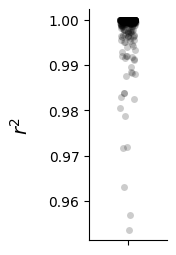

In [8]:
fig, ax = plt.subplots(figsize=(1, 3))
sns.stripplot(fit_df['r_squared'], color='k', alpha=0.2)
sns.despine(top=True, right=True)
plt.ylabel(r"$r^2$", fontsize=14, labelpad=12)
plt.show()

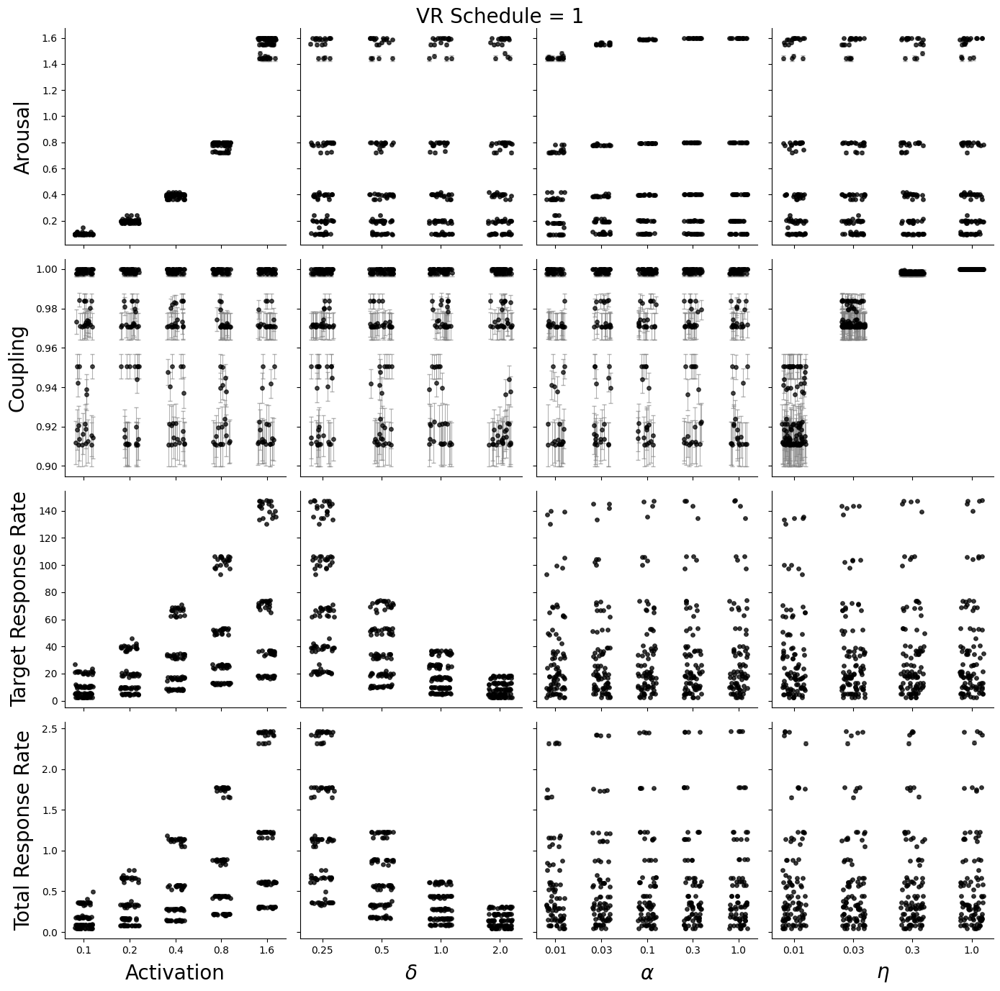

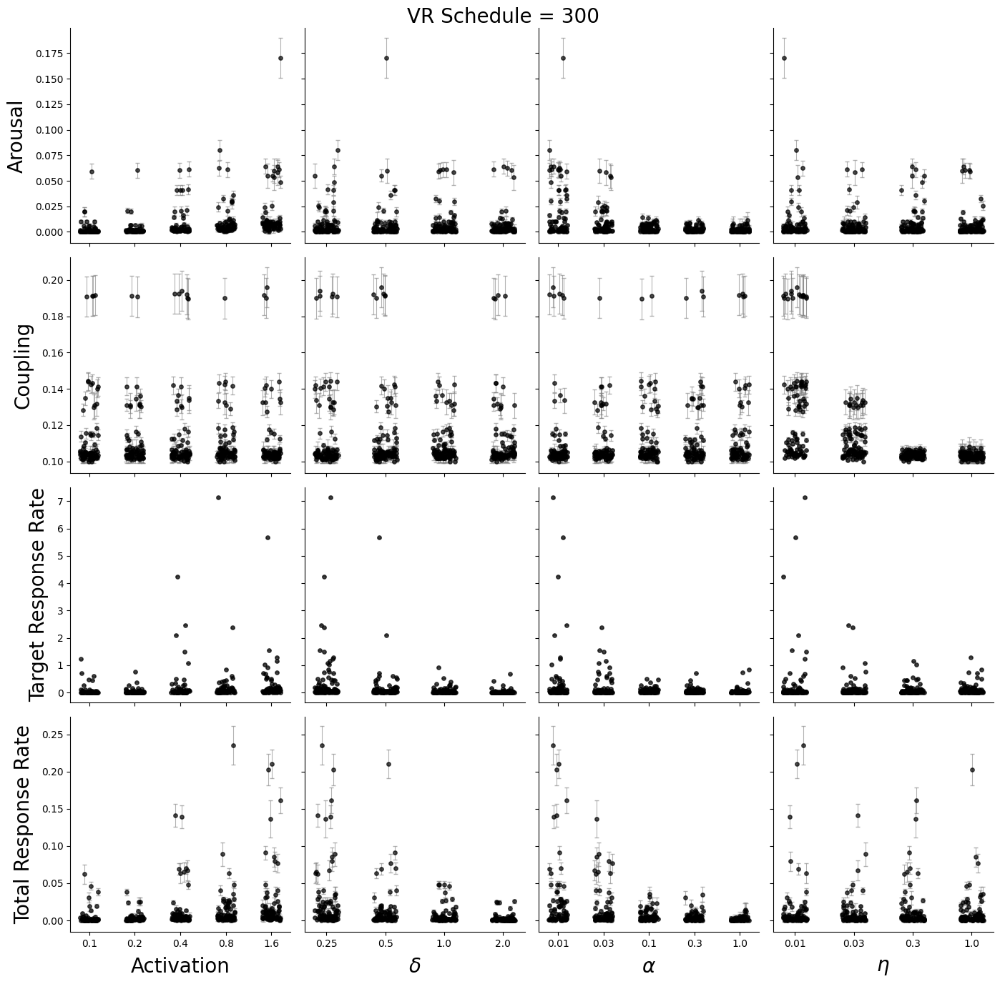

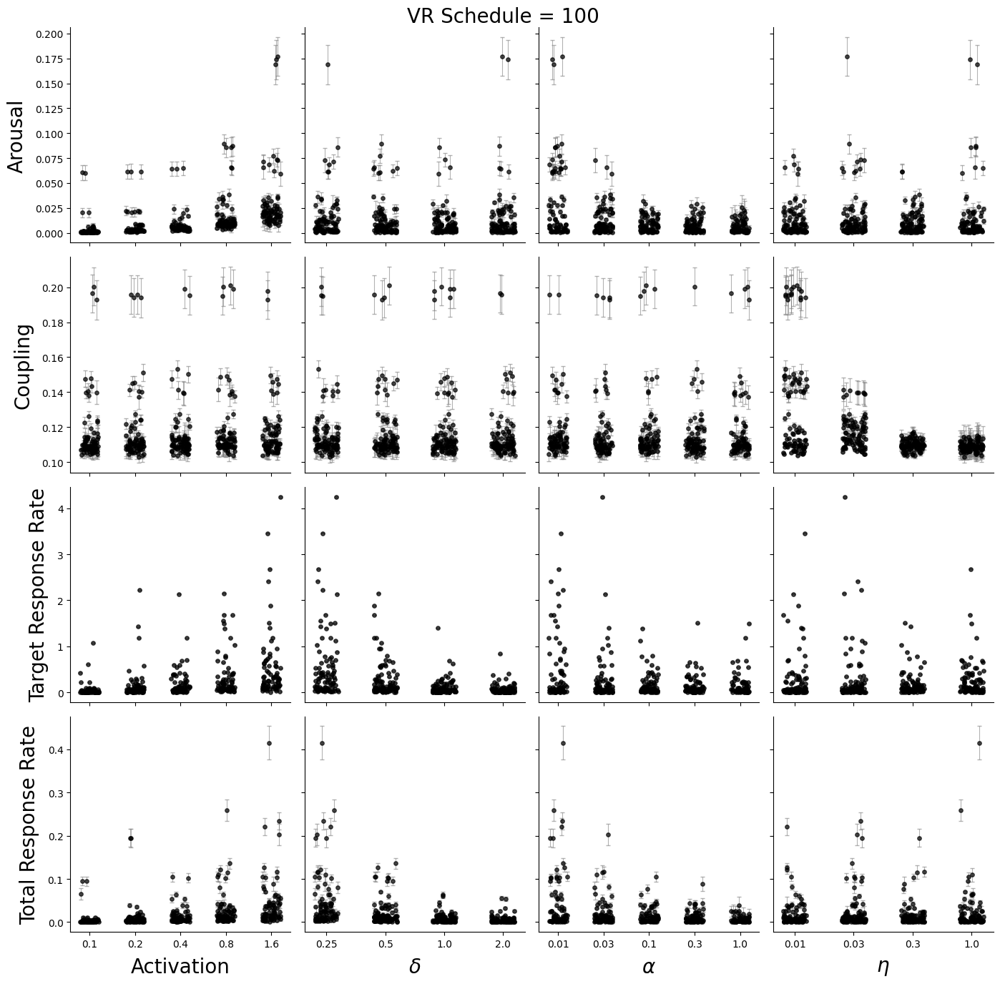

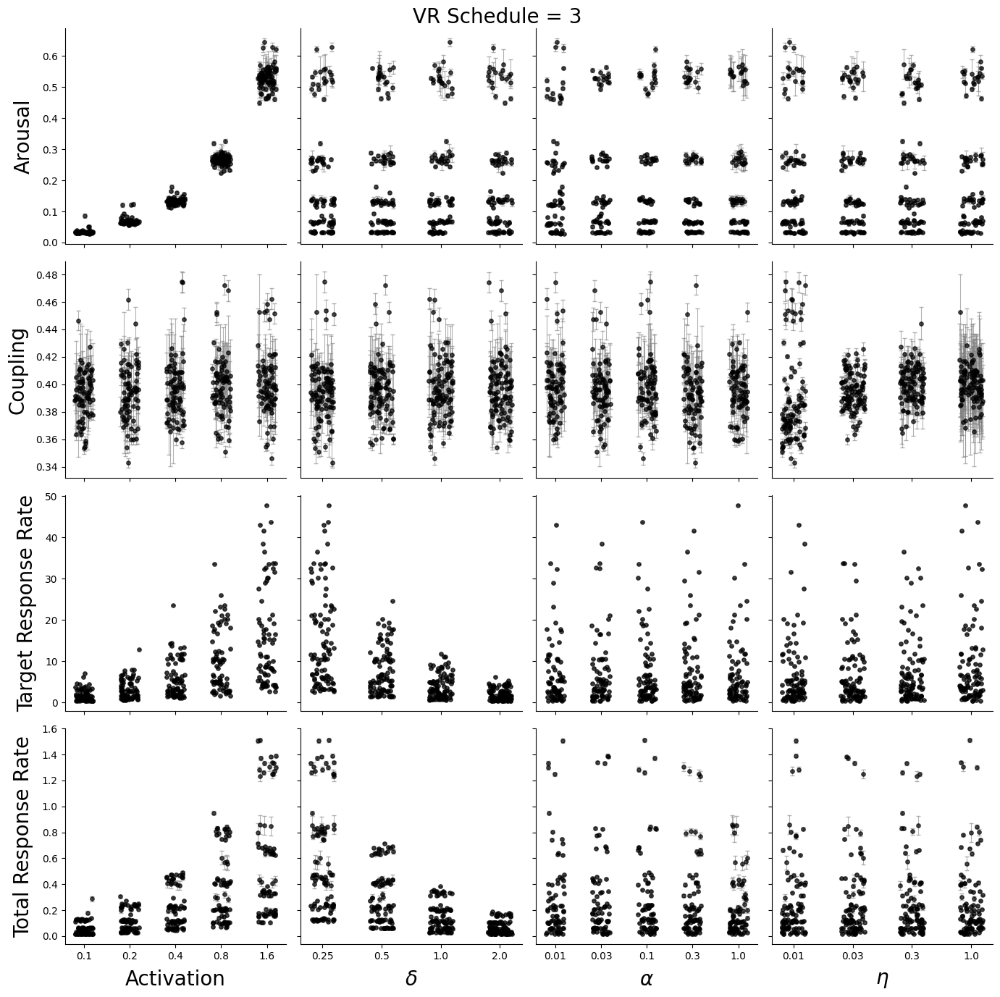

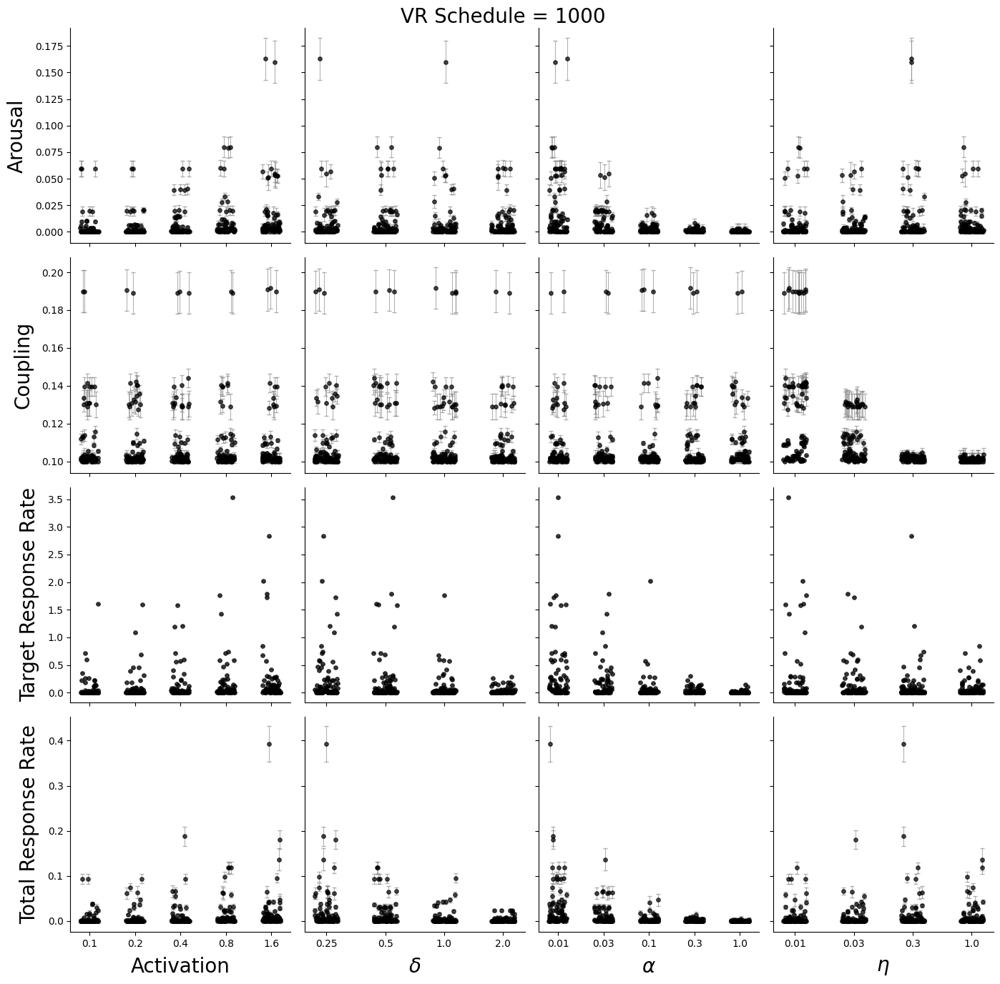

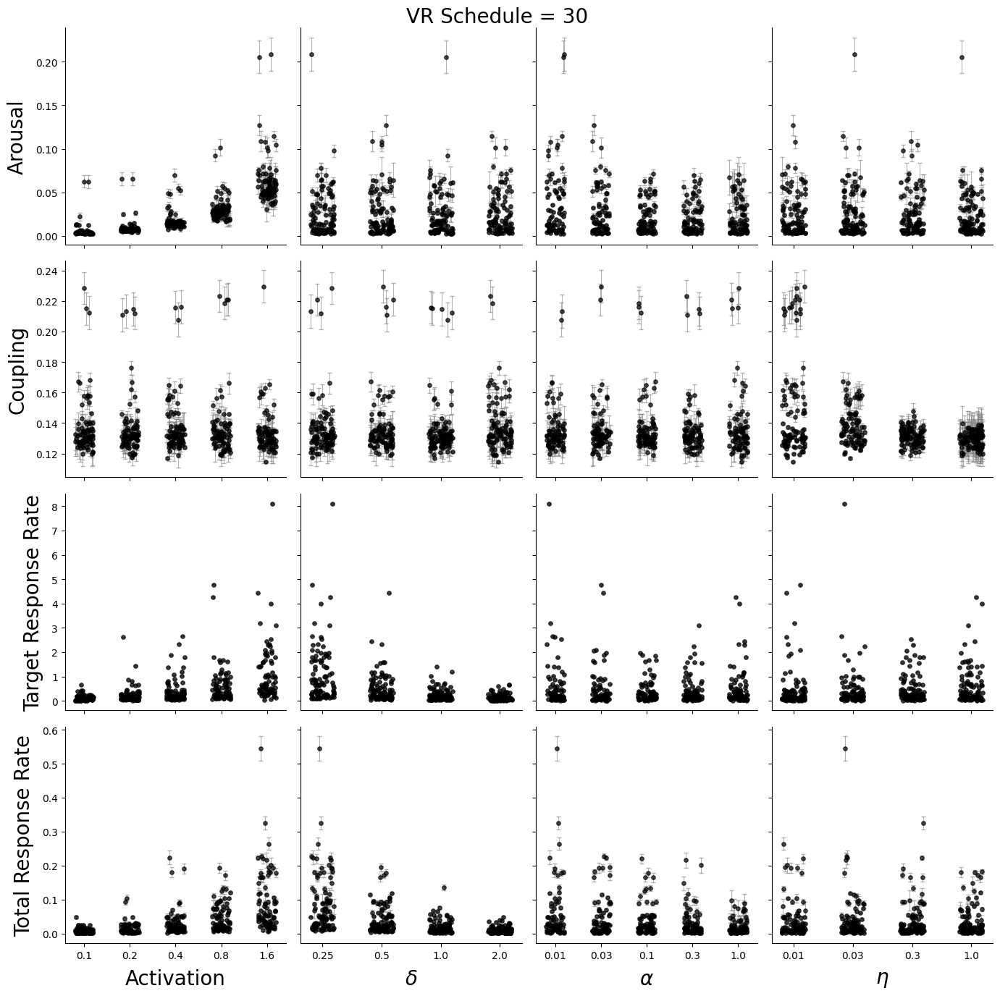

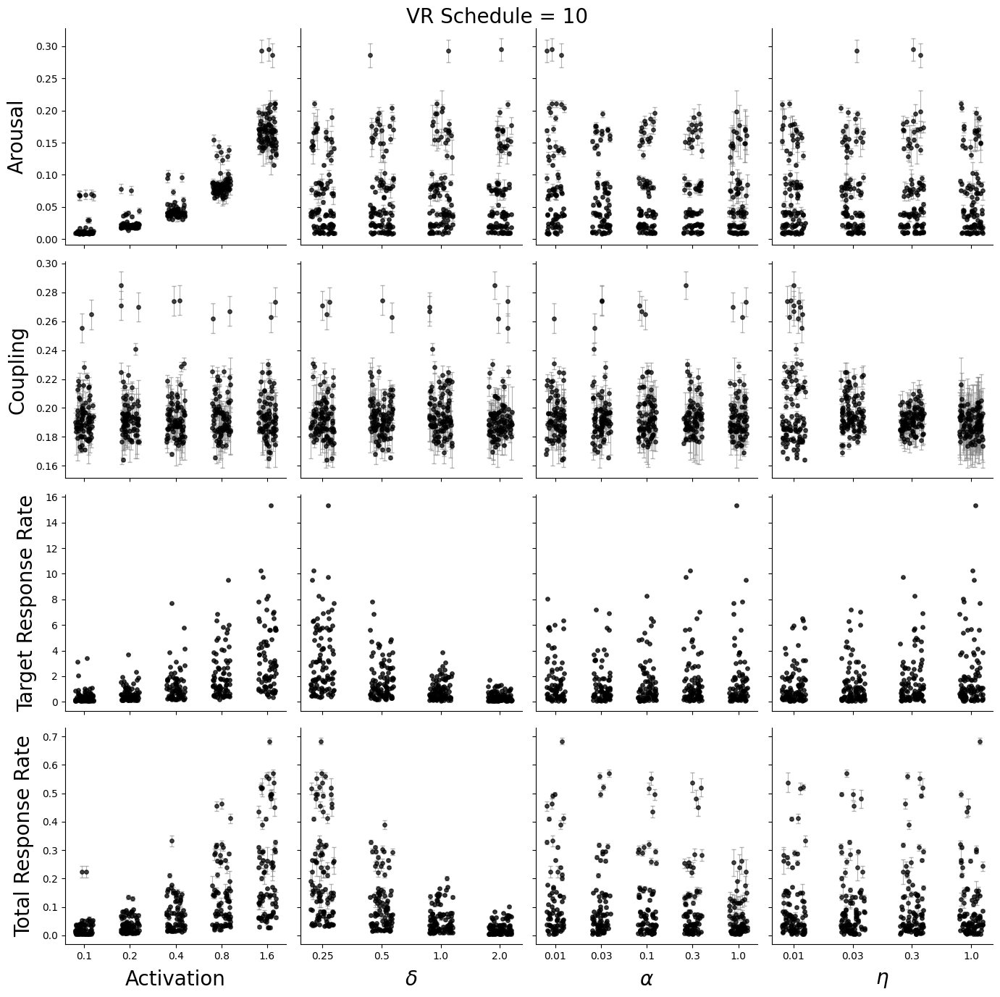

In [9]:
for vr_val in results_df['VR'].unique():
  df_vr = results_df[results_df['VR'] == vr_val]

  # Metric column mapping
  metrics = {
      'arousal_avg': ('Arousal', 'arousal_ci'),
      'coupling_avg': ('Coupling', 'coupling_ci'),
      'b_target_avg': ('Target Response Rate', 'b_target_ci'),
      'b_total_avg': ('Total Response Rate', 'b_total_ci')
  }

  params = ['activation', 'delta', 'alpha', 'eta']

  # Create 4x4 subplot grid
  fig, axs = plt.subplots(4, 4, figsize=(14, 14), sharex='col', sharey=False)
  fig.subplots_adjust(hspace=0.4, wspace=0.4)

  # Plot each metric × parameter
  for row_idx, (metric_col, (metric_label, ci_col)) in enumerate(metrics.items()):
      for col_idx, param in enumerate(params):
          ax = axs[row_idx, col_idx]

          # Get data for this combo
          sub_df = df_vr[[param, metric_col, ci_col]].copy()

          # Convert the x (param) to categorical codes for spacing
          sub_df['x_val'] = pd.Categorical(sub_df[param]).codes
          x_jittered = sub_df['x_val'] + np.random.uniform(-0.2, 0.2, size=len(sub_df))

          # Plot strip manually
          ax.scatter(x_jittered, sub_df[metric_col], color='black', alpha=0.7, s=15, zorder=2)

          # Plot error bars (CIs)
          ax.errorbar(
              x_jittered,
              sub_df[metric_col],
              yerr=sub_df[ci_col],
              fmt='none',
              ecolor='gray',
              elinewidth=0.8,
              capsize=2,
              alpha=0.6,
              zorder=1
          )

          # Add symbolic labels
          param_symbols = {
              'activation': 'Activation',
              'delta': r'$\delta$',
              'alpha': r'$\alpha$',
              'eta': r'$\eta$'
          }

          # Format axes
          if row_idx == 3:
              ax.set_xlabel(param_symbols[param], fontsize=20, labelpad=8, color='k')
              ax.set_xticks(range(len(sub_df[param].unique())))
              ax.set_xticklabels(sorted(sub_df[param].unique()), fontsize=10, color='k')
          else:
              ax.set_xlabel("")
              ax.set_xticklabels([])
              ax.tick_params(labelbottom=False)

          if col_idx == 0:
              ax.set_ylabel(metric_label, fontsize=20, labelpad=8, color='k')
          else:
              ax.set_ylabel("")
              ax.set_yticklabels([])

          ax.grid(False)
          sns.despine(top=True, right=True)

  plt.tight_layout(rect=[0, 0, 1, 0.97])
  plt.suptitle(f"VR Schedule = {vr_val}", fontsize=20)
  plt.show()


# A Range of Single VI Schedules

In [10]:
# --- MPR Model Equations ---
def update_arousal(prev_arousal: float, reinforcement: int, alpha: float, a: float) -> float:
    return alpha * (a * reinforcement) + (1 - alpha) * prev_arousal

def compute_total_response_rate(A: float, delta: float) -> float:
    return (1 / delta) * (A / (1 + A))

def compute_target_response_rate(A: float, delta: float, coupling: float) -> float:
    return coupling * (1 / delta) * (A / (1 + A))

def update_coupling(prev_coupling: float, was_reinforced: bool, learning_rate: float, proximity: float = 1.0) -> float:
    target = proximity if was_reinforced else 0.1
    return prev_coupling + learning_rate * (target - prev_coupling)

def update_step(prev_arousal, prev_coupling, reinforcement, a, delta, alpha, eta):
    A = update_arousal(prev_arousal, reinforcement, alpha, a)
    C = update_coupling(prev_coupling, was_reinforced=bool(reinforcement), learning_rate=eta)
    b_total = compute_total_response_rate(A, delta)
    b_target = compute_target_response_rate(A, delta, C)
    return A, C, b_total, b_target

# --- CI Helper ---
def ci95(data):
    n = len(data)
    return sem(data) * t.ppf(0.975, n - 1)

# --- Updated AO Simulation for Sequential VI ---
def simulate_mpr_vi_sequence(vi_schedule_list, a, delta, alpha, eta, ao_id, steps_per_schedule=1000, avg_peck_rate=2.5):
    A, C = 0.6, 0.5
    all_results = []

    for vi_idx, vi_sec in enumerate(vi_schedule_list):
        A_hist, C_hist, bt_hist, bp_hist = [], [], [], []

        avg_irt = 1.0 / avg_peck_rate
        vi_times = np.cumsum(np.random.exponential(scale=vi_sec, size=steps_per_schedule))
        current_time = 0
        next_reinforcement_time = vi_times[0]
        vi_index = 0

        for _ in range(steps_per_schedule):
            current_time += avg_irt
            reinforcement = 0
            if current_time >= next_reinforcement_time:
                reinforcement = 1
                vi_index += 1
                if vi_index < len(vi_times):
                    next_reinforcement_time = vi_times[vi_index]

            A, C, b_total, b_target = update_step(A, C, reinforcement, a, delta, alpha, eta)
            A_hist.append(A)
            C_hist.append(C)
            bt_hist.append(b_total)
            bp_hist.append(b_target)

        all_results.append({
            'AO_id': ao_id,
            'vi_sequence_index': vi_idx,
            'VI': vi_sec,
            'arousal_avg': np.mean(A_hist),
            'arousal_min': np.min(A_hist),
            'arousal_max': np.max(A_hist),
            'arousal_ci': ci95(A_hist),
            'coupling_avg': np.mean(C_hist),
            'coupling_min': np.min(C_hist),
            'coupling_max': np.max(C_hist),
            'coupling_ci': ci95(C_hist),
            'b_total_avg': np.mean(bt_hist),
            'b_total_min': np.min(bt_hist),
            'b_total_max': np.max(bt_hist),
            'b_total_ci': ci95(bt_hist),
            'b_target_avg': np.mean(bp_hist),
            'b_target_min': np.min(bp_hist),
            'b_target_max': np.max(bp_hist),
            'b_target_ci': ci95(bp_hist),
            'activation': a,
            'delta': delta,
            'alpha': alpha,
            'eta': eta,
        })

    return all_results


# Parameters
deltas = [0.25, 0.50, 1.0, 2.0]
activations = [0.1, 0.2, 0.4, 0.8, 1.6]
alphas = [0.01, 0.03, 0.1, 0.3, 1.0]
etas = [0.01, 0.03, 0.3, 1.0]
vi_schedules = [1, 3, 10, 30, 100, 300, 1000]

# Run each AO across all VI schedules in random order
results_vi = []
grid = list(product(activations, deltas, alphas, etas))

for ao_id, (a, delta, alpha, eta) in enumerate(tqdm(grid, desc="Running AO simulations through VI schedules")):
    shuffled_vis = np.random.permutation(vi_schedules)
    sim_result_list = simulate_mpr_vi_sequence(shuffled_vis, a, delta, alpha, eta, ao_id=ao_id)
    results_vi.extend(sim_result_list)

# Final DataFrame
results_vi_df = pd.DataFrame(results_vi)

# Convert responses per sec to response per min
results_vi_df['b_target_avg'] = results_vi_df['b_target_avg']*60

Running AO simulations through VI schedules: 100%|██████████| 400/400 [00:16<00:00, 24.26it/s]


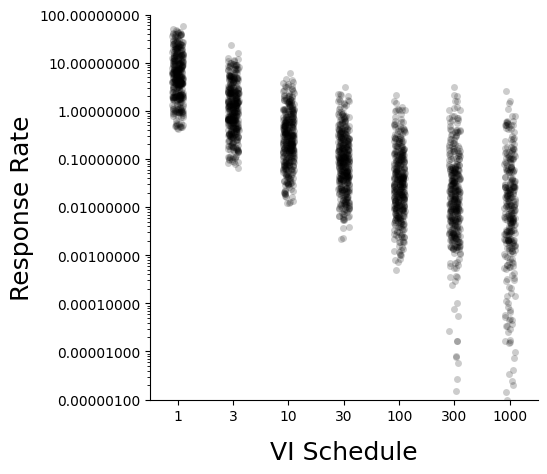

In [11]:
fig, ax = plt.subplots(figsize=(5, 5))
sns.stripplot(
    x='VI',
    y='b_target_avg',
    data=results_vi_df,
    color='k',
    alpha=0.2
)
plt.yscale("log")
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.8f'))
plt.ylim(0.000001, 100)
ax.grid(False)
sns.despine(top=True, right=True)
plt.ylabel("Response Rate", fontsize=18)
plt.xlabel("VI Schedule", labelpad=12, fontsize=18)
plt.show()

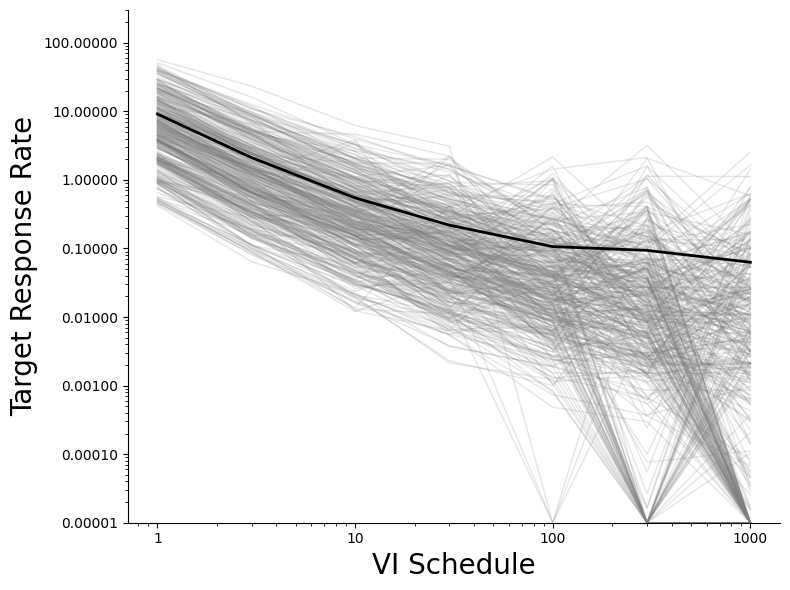

In [12]:
# Sort the data so each AO's line is plotted in VR sequence order
results_df_sorted = results_vi_df.sort_values(['AO_id', 'VI'])
results_df_sorted['b_target_avg'] = results_df_sorted['b_target_avg'].clip(lower=0.00001)

# Set up the figure
fig, ax = plt.subplots(figsize=(8, 6))

# Plot each AO's line
for _, ao_data in results_df_sorted.groupby("AO_id"):
    ax.plot(
        ao_data['VI'],
        ao_data['b_target_avg'],
        color='gray',
        alpha=0.2,
        linewidth=1
    )

# Optional: Overlay a central tendency (e.g., median or mean line)
avg_data = results_df_sorted.groupby('VI')['b_target_avg'].mean().reset_index()
sns.lineplot(
    data=avg_data,
    x='VI', y='b_target_avg',
    color='black',
    linewidth=2,
    label='Mean across AOs'
)

# Log scales for both axes
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_ylim(0.00001, 300)
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.5f'))
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.0f'))

# Labels and style
ax.set_ylabel("Target Response Rate", fontsize=20)
ax.set_xlabel("VI Schedule", fontsize=20)
ax.legend().remove()
ax.grid(False)
sns.despine()
plt.tight_layout()
plt.show()

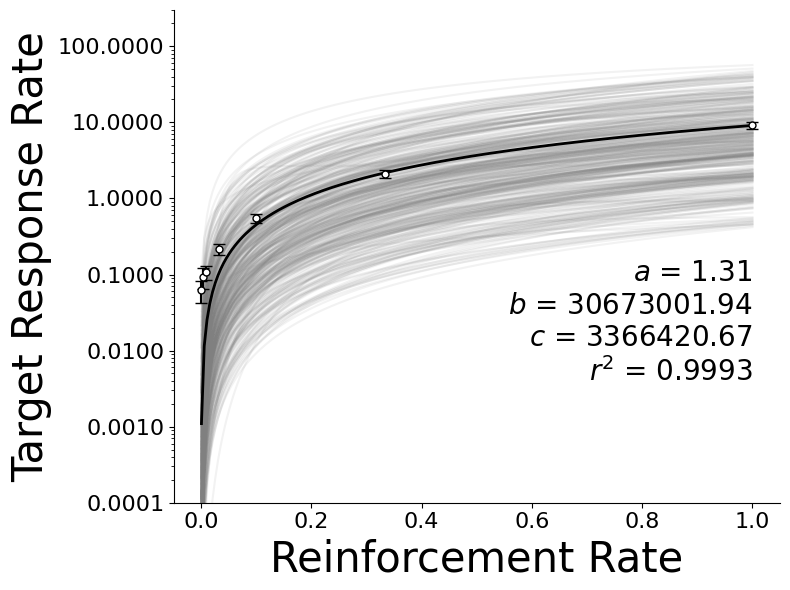

In [13]:
# Compute reinforcement rate
results_vi_df['r'] = 1 / results_vi_df['VI']

# Define generalized hyperbola
def generalized_hyperbola(r, a, b, c):
    return (b * (r ** a)) / (r ** a + c)

# Fit function per AO
def fit_ao_hyperbola(df):
    try:
        popt, _ = curve_fit(
            generalized_hyperbola,
            df['r'],
            df['b_target_avg'],
            p0=[1.0, 1.0, 0.1],
            bounds=(0, np.inf),
            maxfev=10000
        )
        return popt
    except:
        return [np.nan, np.nan, np.nan]

# Fit and store per-AO curves
fit_results = []
ao_curves = []

# Loop over AOs
for ao_id, group in results_vi_df.groupby("AO_id"):
    try:
        # Fit hyperbola
        popt, _ = curve_fit(
            generalized_hyperbola,
            group['r'],
            group['b_target_avg'],
            p0=[1.0, 1.0, 0.1],
            bounds=(0, np.inf),
            maxfev=10000
        )

        # Predict using the fit
        predicted = generalized_hyperbola(group['r'], *popt)

        # Compute R²
        residuals = group['b_target_avg'] - predicted
        ss_res = np.sum(residuals ** 2)
        ss_tot = np.sum((group['b_target_avg'] - np.mean(group['b_target_avg'])) ** 2)
        r_squared = 1 - (ss_res / ss_tot)

        # Store parameters and R²
        fit_results.append({
            'AO_id': ao_id,
            'a': popt[0],
            'b': popt[1],
            'c': popt[2],
            'r_squared': r_squared
        })

        # Store predicted curve
        r_vals = np.linspace(group['r'].min(), group['r'].max(), 200)
        predicted_curve = generalized_hyperbola(r_vals, *popt)
        ao_curves.append(pd.DataFrame({
            'AO_id': ao_id,
            'r': r_vals,
            'predicted_b_target': predicted_curve
        }))

    except:
        continue  # skip AOs that fail to fit

fit_df = pd.DataFrame(fit_results)
curves_df = pd.concat(ao_curves, ignore_index=True)

# Group-level mean and CI
grouped = results_vi_df.groupby('r').agg(
    b_target_avg_mean=('b_target_avg', 'mean'),
    b_target_avg_se=('b_target_avg', sem)
).reset_index()
grouped['b_target_avg_ci'] = grouped['b_target_avg_se'] * t.ppf(0.975, df=len(results_df) - 1)

# Fit group-level curve
popt, _ = curve_fit(
    generalized_hyperbola,
    grouped['r'],
    grouped['b_target_avg_mean'],
    p0=[1.0, 1.0, 0.1],
    bounds=(0, np.inf)
)
r_vals = np.linspace(grouped['r'].min(), grouped['r'].max(), 200)
group_fit = generalized_hyperbola(r_vals, *popt)

# R² calculation for group-level fit
residuals = grouped['b_target_avg_mean'] - generalized_hyperbola(grouped['r'], *popt)
ss_res = np.sum(residuals ** 2)
ss_tot = np.sum((grouped['b_target_avg_mean'] - np.mean(grouped['b_target_avg_mean'])) ** 2)
r_squared = 1 - (ss_res / ss_tot)

# Plot
plt.figure(figsize=(8, 6))

# Plot all individual AO fits
for ao_id, ao_curve in curves_df.groupby("AO_id"):
    plt.plot(ao_curve['r'], ao_curve['predicted_b_target'], alpha=0.1, color='gray')

# Plot group-level fit
plt.plot(r_vals, group_fit, color='black', linewidth=2, label='Group Mean Fit')

# Overlay mean ± CI as white points with black outlines
plt.errorbar(
    grouped['r'],
    grouped['b_target_avg_mean'],
    yerr=grouped['b_target_avg_ci'],
    fmt='o',
    color='white',
    markersize=5,
    elinewidth=1.5,
    ecolor='black',
    capsize=4,
    markeredgecolor='black',
    label='Mean ± 95% CI'
)

# Add annotation for group-level fit parameters
plt.text(
    x=1,
    y=0.004,
    s=f"$a$ = {popt[0]:.2f}\n$b$ = {popt[1]:.2f}\n$c$ = {popt[2]:.2f}\n$r^2$ = {r_squared:.4f}",
    fontsize=20,
    ha='right'
)

# Style
plt.yscale("log")
plt.xlabel("Reinforcement Rate", fontsize=30)
plt.ylabel("Target Response Rate", fontsize=30)
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.4f'))
plt.legend().remove()
plt.ylim(.0001, 300)
plt.grid(False)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
sns.despine()
plt.tight_layout()
plt.show()

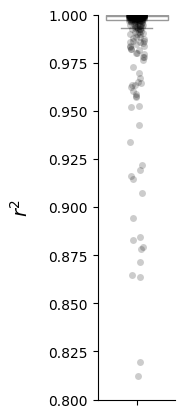

,r_squared
count,400.000000
mean,0.980894
std,0.073000
min,0.346293
25%,0.996896
50%,0.999256
75%,0.999776
max,0.999988


In [14]:
fig, ax = plt.subplots(figsize=(1, 5))
sns.stripplot(fit_df['r_squared'], color='k', alpha=0.2)
sns.boxplot(fit_df['r_squared'], color='w', showfliers=False)
sns.despine(top=True, right=True)
plt.ylabel(r"$r^2$", fontsize=14, labelpad=12)
plt.ylim(0.8, 1)
plt.show()
fit_df['r_squared'].describe()

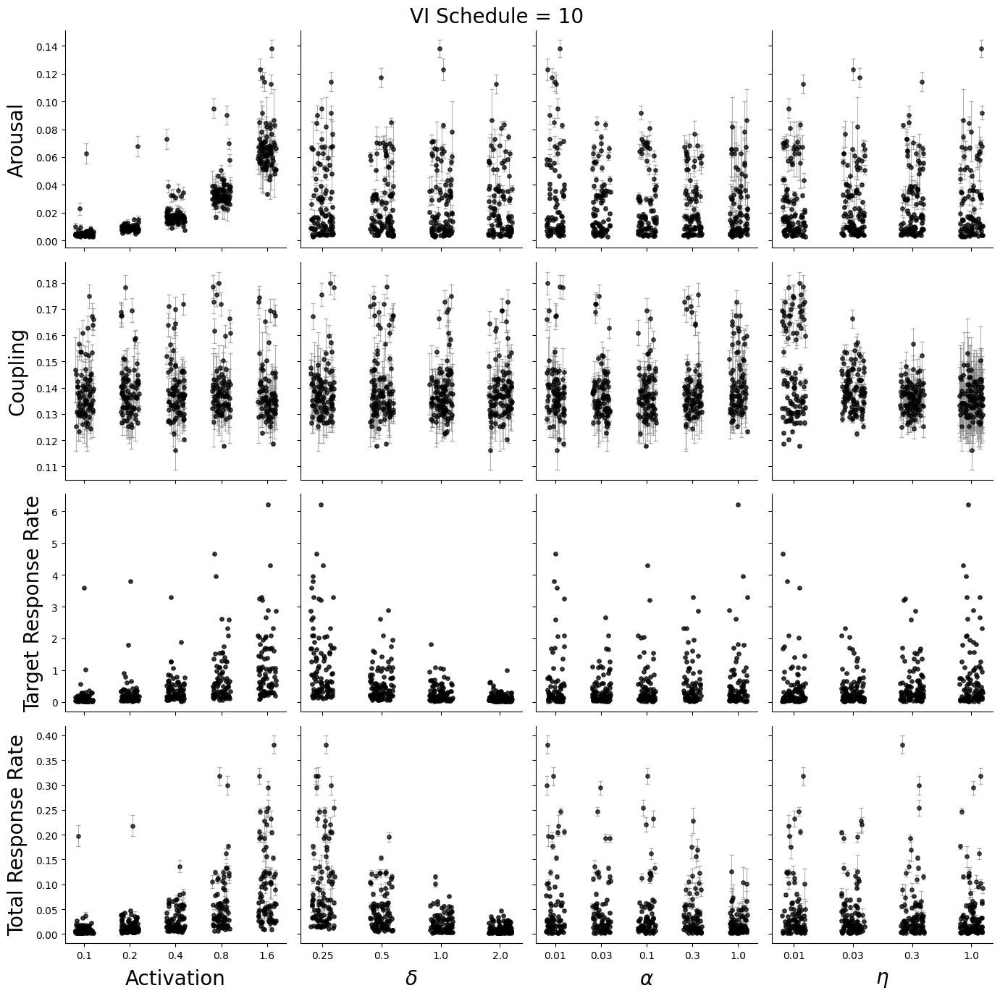

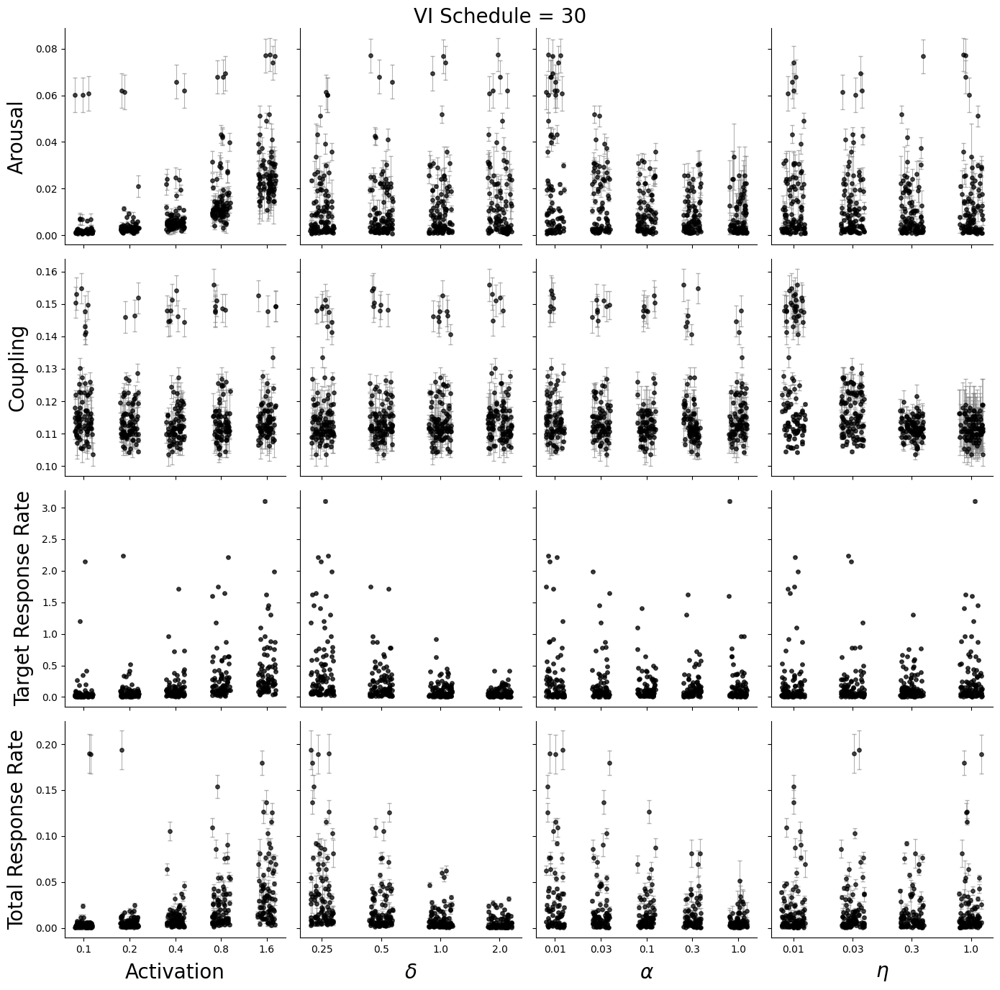

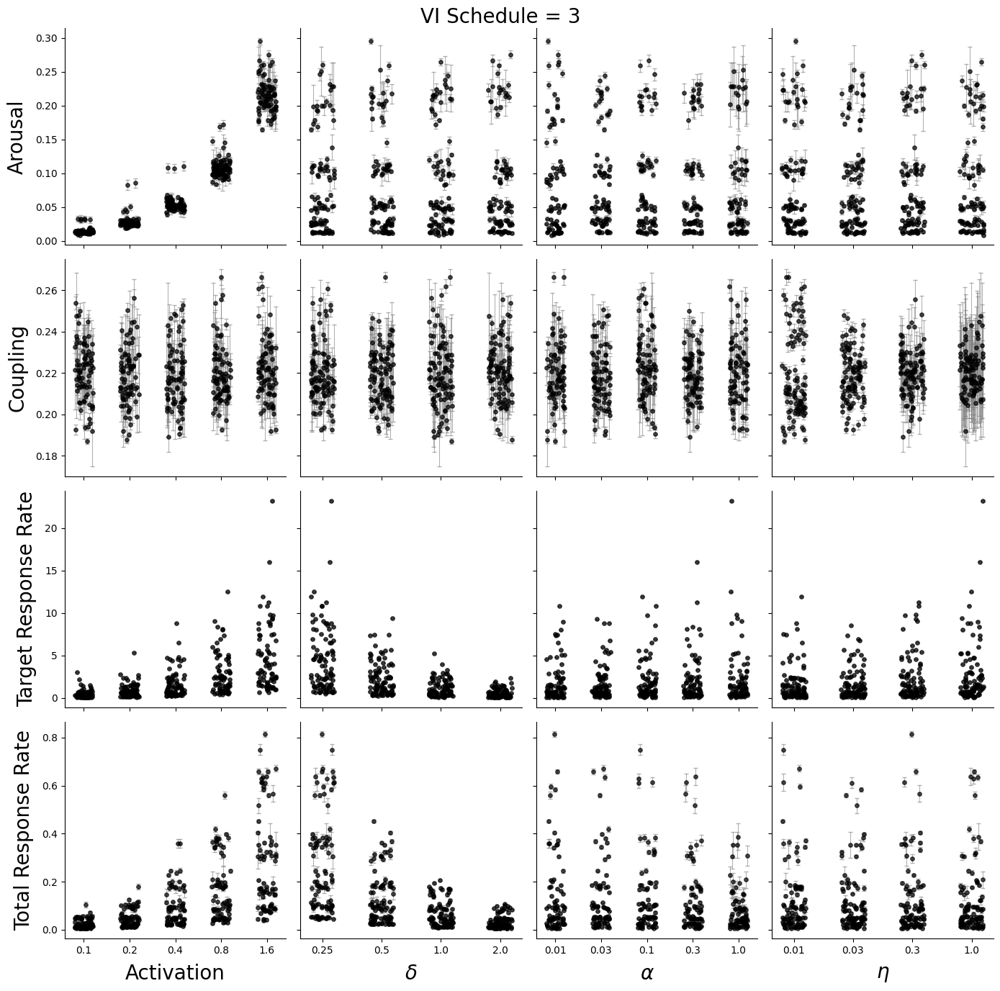

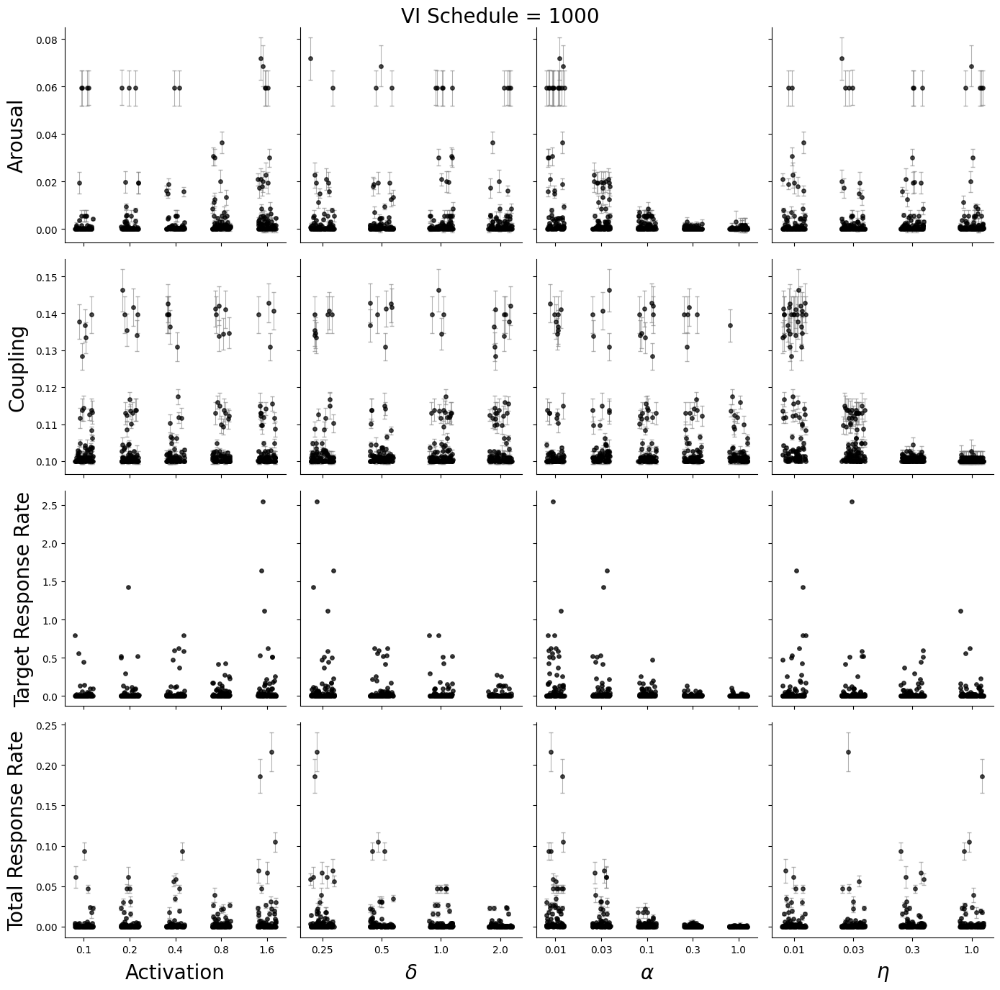

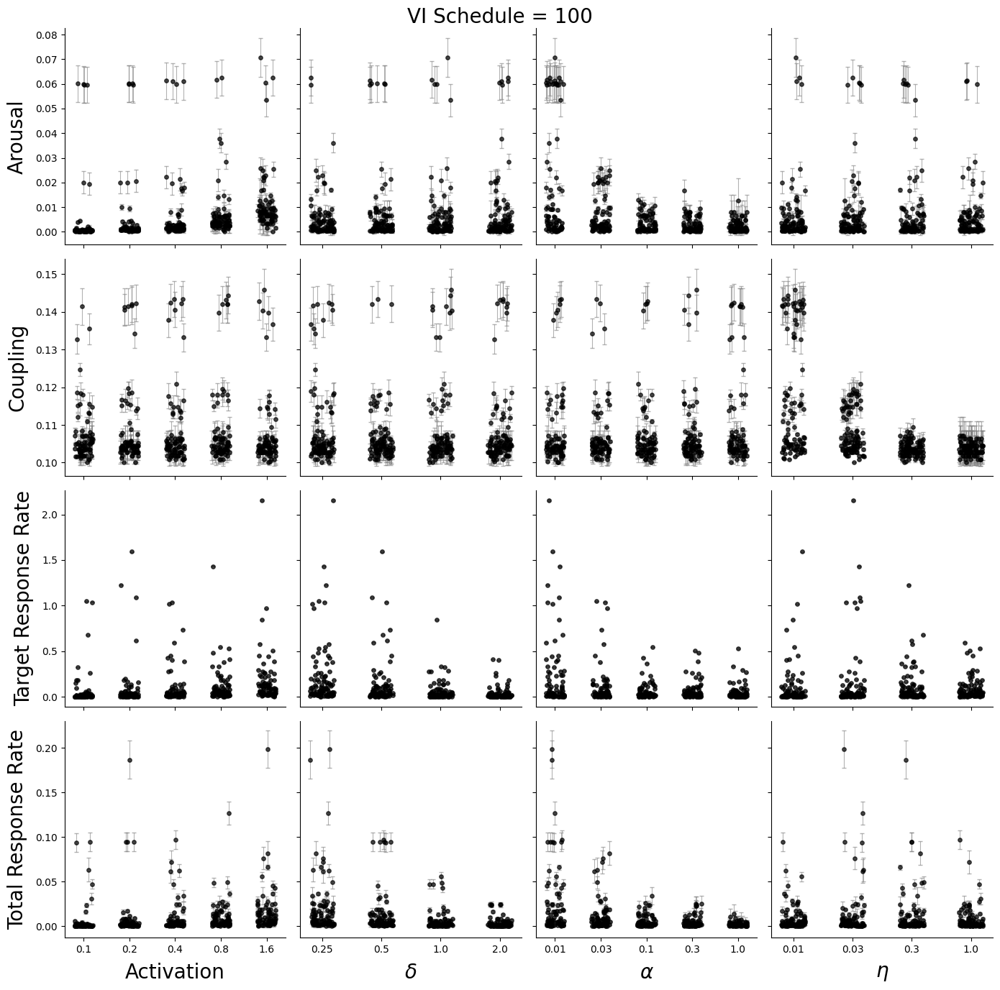

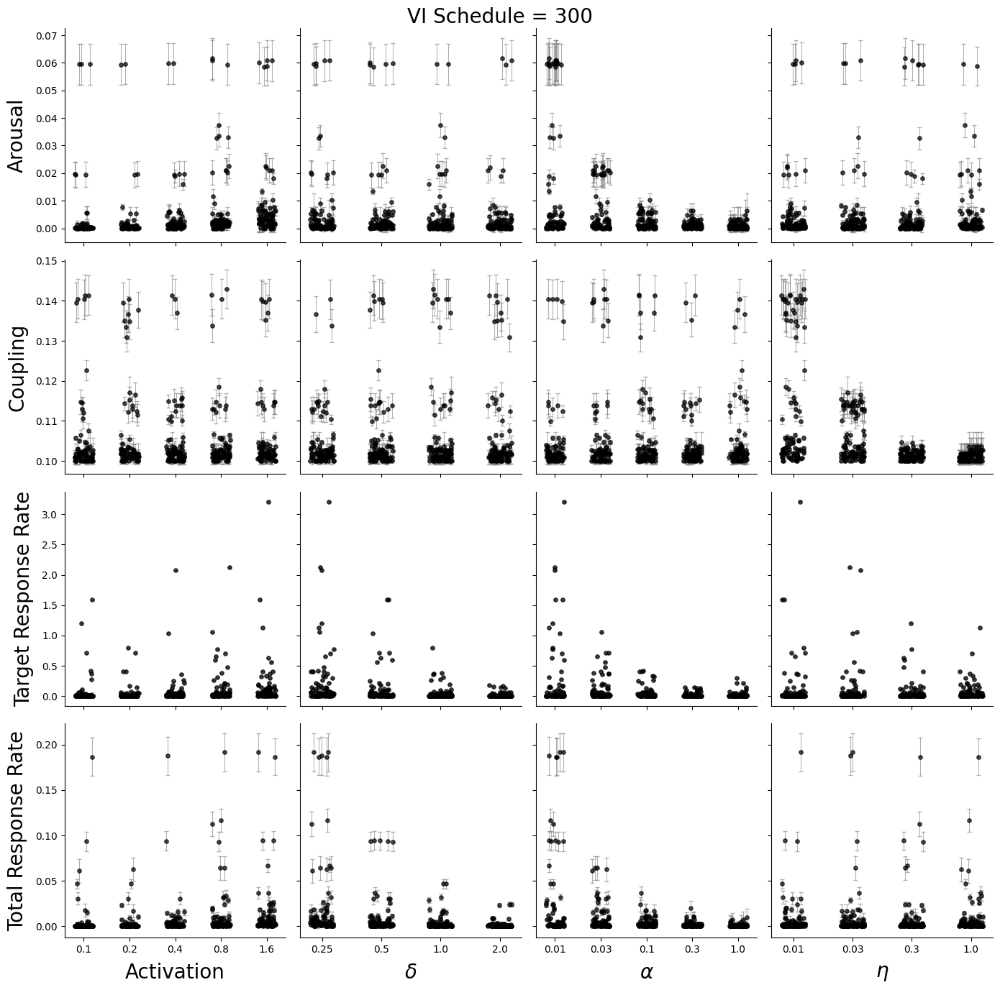

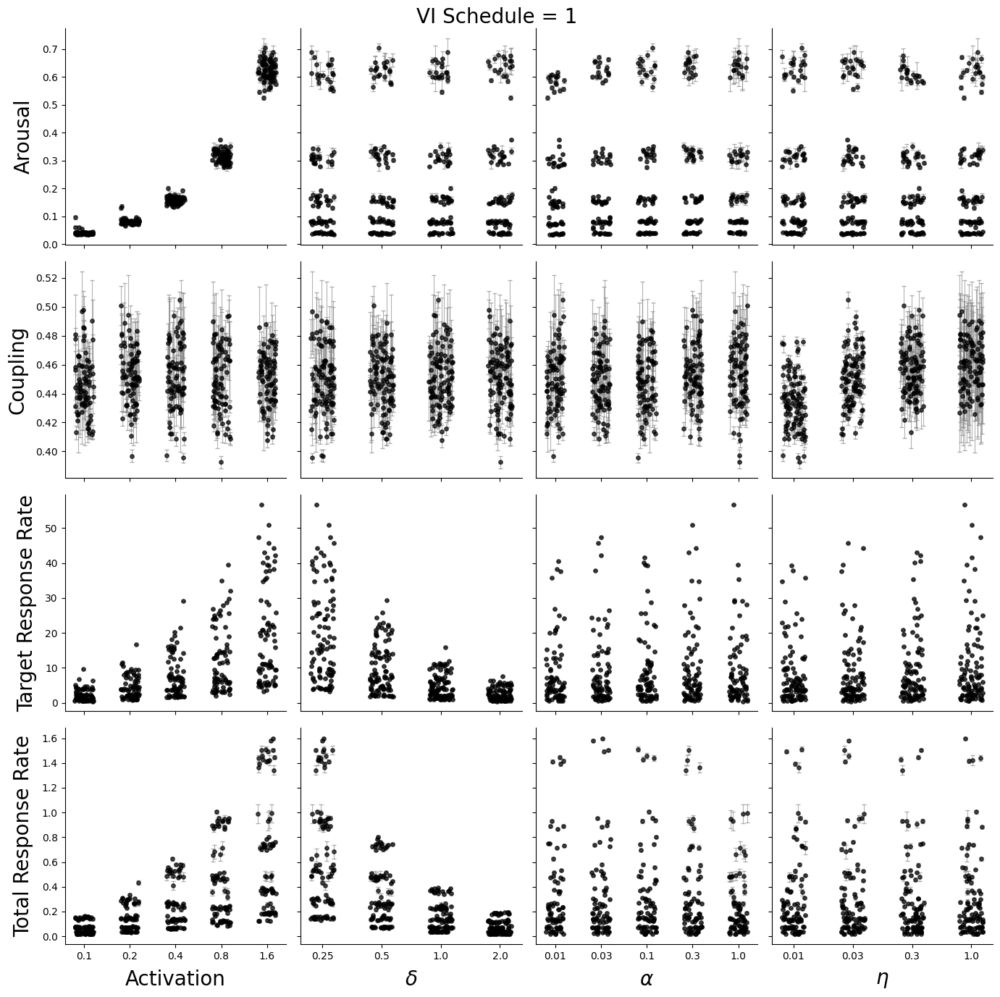

In [15]:
for vi_focus in results_vi_df['VI'].unique():
  df_vi = results_vi_df[results_vi_df['VI'] == vi_focus].copy()

  # Metric → Label + CI column mapping
  metrics_vi = {
      'arousal_avg': ('Arousal', 'arousal_ci'),
      'coupling_avg': ('Coupling', 'coupling_ci'),
      'b_target_avg': ('Target Response Rate', 'b_target_ci'),
      'b_total_avg': ('Total Response Rate', 'b_total_ci')
  }

  params = ['activation', 'delta', 'alpha', 'eta']

  # Create 4x4 subplot grid
  fig, axs = plt.subplots(4, 4, figsize=(14, 14), sharex='col', sharey=False)
  fig.subplots_adjust(hspace=0.4, wspace=0.4)

  # Plot each metric × parameter
  for row_idx, (metric_col, (metric_label, ci_col)) in enumerate(metrics_vi.items()):
      for col_idx, param in enumerate(params):
          ax = axs[row_idx, col_idx]

          # Get data for this combo
          sub_df = df_vi[[param, metric_col, ci_col]].copy()

          # Convert the x (param) to categorical codes for spacing
          sub_df['x_val'] = pd.Categorical(sub_df[param]).codes
          x_jittered = sub_df['x_val'] + np.random.uniform(-0.2, 0.2, size=len(sub_df))

          # Plot strip manually
          ax.scatter(x_jittered, sub_df[metric_col], color='black', alpha=0.7, s=15, zorder=2)

          # Plot error bars (CIs)
          ax.errorbar(
              x_jittered,
              sub_df[metric_col],
              yerr=sub_df[ci_col],
              fmt='none',
              ecolor='gray',
              elinewidth=0.8,
              capsize=2,
              alpha=0.6,
              zorder=1
          )

          # Add symbolic labels
          param_symbols = {
              'activation': 'Activation',
              'delta': r'$\delta$',
              'alpha': r'$\alpha$',
              'eta': r'$\eta$'
          }

          # Format axes
          if row_idx == 3:
              ax.set_xlabel(param_symbols[param], fontsize=20, labelpad=8, color='k')
              ax.set_xticks(range(len(sub_df[param].unique())))
              ax.set_xticklabels(sorted(sub_df[param].unique()), fontsize=10, color='k')
          else:
              ax.set_xlabel("")
              ax.set_xticklabels([])
              ax.tick_params(labelbottom=False)

          if col_idx == 0:
              ax.set_ylabel(metric_label, fontsize=20, labelpad=8, color='k')
          else:
              ax.set_ylabel("")
              ax.set_yticklabels([])

          ax.grid(False)
          sns.despine(top=True, right=True)

  plt.tight_layout(rect=[0, 0, 1, 0.97])
  plt.suptitle(f"VI Schedule = {vi_focus}", fontsize=20)
  plt.show()

# A Range of Concurrent VRs

In [16]:
import numpy as np
import pandas as pd
from itertools import product
from tqdm import tqdm
from scipy.stats import sem, t

# --- MPR Model Equations ---
def update_arousal(prev_arousal: float, reinforcement: int, alpha: float, a: float) -> float:
    return alpha * (a * reinforcement) + (1 - alpha) * prev_arousal

def compute_total_response_rate(A: float, delta: float) -> float:
    return (1 / delta) * (A / (1 + A))

def compute_target_response_rate(A: float, delta: float, coupling: float) -> float:
    return coupling * (1 / delta) * (A / (1 + A))

def update_coupling(prev_coupling: float, was_reinforced: bool, learning_rate: float, proximity: float = 1.0) -> float:
    target = proximity if was_reinforced else 0.1
    return prev_coupling + learning_rate * (target - prev_coupling)

def update_step(prev_arousal, prev_coupling, reinforcement, a, delta, alpha, eta):
    A = update_arousal(prev_arousal, reinforcement, alpha, a)
    C = update_coupling(prev_coupling, was_reinforced=bool(reinforcement), learning_rate=eta)
    b_total = compute_total_response_rate(A, delta)
    b_target = compute_target_response_rate(A, delta, C)
    return A, C, b_total, b_target

# --- CI Helper ---
def ci95(data):
    n = len(data)
    return sem(data) * t.ppf(0.975, n - 1)

# --- Simulation with Persistent State Across Concurrent VR Pairs ---
def simulate_concurrent_mpr_sequence(vr_pairs, a, delta, alpha, eta, ao_id, num_steps=1000):
    A1, C1 = 0.6, 0.5
    A2, C2 = 0.6, 0.5
    all_results = []

    for pair_index, (vr1, vr2) in enumerate(vr_pairs):
        A1_hist, A2_hist = [], []
        C1_hist, C2_hist = [], []
        b1_hist, b2_hist = [], []

        for _ in range(num_steps):
            p1 = C1 / (C1 + C2)
            choice = np.random.choice([1, 2], p=[p1, 1 - p1])

            r1 = np.random.rand() < (1 / vr1)
            r2 = np.random.rand() < (1 / vr2)

            if choice == 1:
                A1, C1, _, _ = update_step(A1, C1, r1, a, delta, alpha, eta)
                A2, C2 = update_arousal(A2, 0, alpha, a), update_coupling(C2, False, eta)
            else:
                A2, C2, _, _ = update_step(A2, C2, r2, a, delta, alpha, eta)
                A1, C1 = update_arousal(A1, 0, alpha, a), update_coupling(C1, False, eta)

            A1_hist.append(A1)
            A2_hist.append(A2)
            C1_hist.append(C1)
            C2_hist.append(C2)
            b1_hist.append(1 if choice == 1 else 0)
            b2_hist.append(1 if choice == 2 else 0)

        all_results.append({
            'AO_id': ao_id,
            'pair_index': pair_index,
            'VR1': vr1,
            'VR2': vr2,
            'reinforcement_ratio': np.round((vr2 / vr1), 2),
            'arousal1_avg': np.mean(A1_hist),
            'arousal2_avg': np.mean(A2_hist),
            'coupling1_avg': np.mean(C1_hist),
            'coupling2_avg': np.mean(C2_hist),
            'choice1_avg': np.mean(b1_hist),
            'choice2_avg': np.mean(b2_hist),
            'arousal1_ci': ci95(A1_hist),
            'arousal2_ci': ci95(A2_hist),
            'coupling1_ci': ci95(C1_hist),
            'coupling2_ci': ci95(C2_hist),
            'choice1_ci': ci95(b1_hist),
            'choice2_ci': ci95(b2_hist),
            'activation': a,
            'delta': delta,
            'alpha': alpha,
            'eta': eta
        })

    return all_results

# Parameter Grid
deltas = [0.25, 0.50, 1.0, 2.0]
activations = [0.1, 0.2, 0.4, 0.8, 1.6]
alphas = [0.01, 0.03, 0.1, 0.3, 1.0]
etas = [0.01, 0.03, 0.3, 1.0]
vr_pairs = [(1, 9), (1, 3), (2, 2), (3, 1), (9, 1)]  # all pairs to be run per AO

# Run each AO through all VR pairs
concurrent_results = []
grid = list(product(activations, deltas, alphas, etas))

for ao_id, (a, delta, alpha, eta) in enumerate(tqdm(grid, desc="Running concurrent VR AOs")):
    sim_result_list = simulate_concurrent_mpr_sequence(vr_pairs, a, delta, alpha, eta, ao_id=ao_id)
    concurrent_results.extend(sim_result_list)

# Final DataFrame
results_concurrent_df = pd.DataFrame(concurrent_results)

Running concurrent VR AOs: 100%|██████████| 400/400 [01:06<00:00,  5.99it/s]


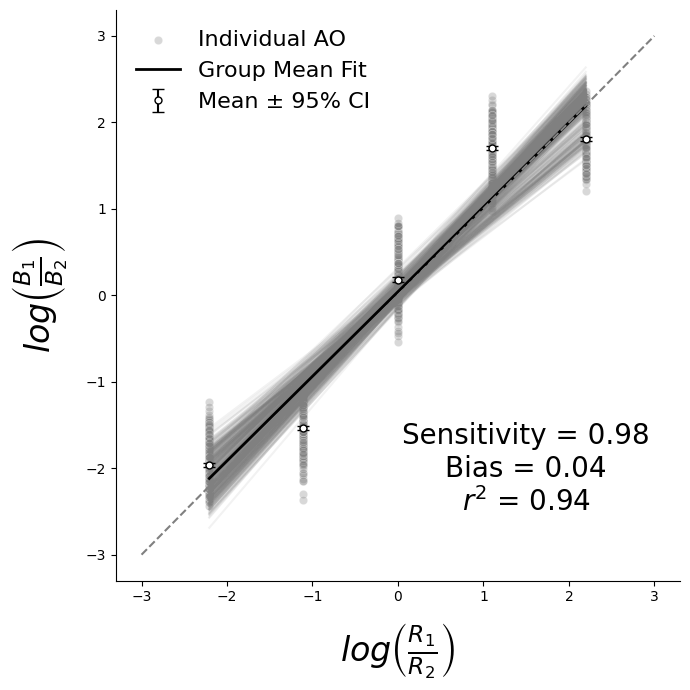

In [17]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from scipy.stats import sem, t

# Step 1: Prep data
results_concurrent_df['response_ratio'] = results_concurrent_df['choice1_avg'] / results_concurrent_df['choice2_avg']
results_concurrent_df['log_resp_ratio'] = np.log(results_concurrent_df['response_ratio'])
results_concurrent_df['log_reinf_ratio'] = np.log(results_concurrent_df['reinforcement_ratio'])

# Step 2: Fit matching law to each AO
ao_fits = []
ao_lines = []

for ao_id, group in results_concurrent_df.groupby("AO_id"):
    if group['log_reinf_ratio'].nunique() < 2:
        continue
    X = group[['log_reinf_ratio']]
    y = group['log_resp_ratio']
    model = LinearRegression().fit(X, y)
    slope = model.coef_[0]
    intercept = model.intercept_
    r2 = r2_score(y, model.predict(X))

    ao_fits.append({
        'AO_id': ao_id,
        'slope': slope,
        'intercept': intercept,
        'r_squared': r2
    })

    # Store line for plotting
    x_range = np.linspace(X.min(), X.max(), 100)
    ao_lines.append(pd.DataFrame({
        'AO_id': ao_id,
        'x': x_range.squeeze(),
        'y': model.predict(pd.DataFrame({'log_reinf_ratio': x_range.squeeze()}))
    }))

fit_df = pd.DataFrame(ao_fits)
ao_lines_df = pd.concat(ao_lines)

# Step 3: Aggregate means across AOs per VR pair
grouped_means = results_concurrent_df.groupby(['VR1', 'VR2', 'reinforcement_ratio']).agg(
    log_resp_ratio_mean=('log_resp_ratio', 'mean'),
    log_resp_ratio_se=('log_resp_ratio', sem),
    log_reinf_ratio=('log_reinf_ratio', 'mean')
).reset_index()

grouped_means['log_resp_ratio_ci'] = grouped_means['log_resp_ratio_se'] * t.ppf(0.975, df=len(results_concurrent_df) - 1)

# Step 4: Fit matching law to group means
X_group = grouped_means[['log_reinf_ratio']]
y_group = grouped_means['log_resp_ratio_mean']

group_model = LinearRegression().fit(X_group, y_group)
group_slope = group_model.coef_[0]
group_intercept = group_model.intercept_
group_r2 = r2_score(y_group, group_model.predict(X_group))

x_range_group = np.linspace(X_group.min(), X_group.max(), 100)
y_pred_group = group_model.predict(pd.DataFrame({'log_reinf_ratio': x_range_group.squeeze()}))

# Step 5: Plot everything
plt.figure(figsize=(7, 7))

# Gray points and individual AO fits
sns.scatterplot(
    x='log_reinf_ratio',
    y='log_resp_ratio',
    data=results_concurrent_df,
    color='gray',
    alpha=0.3,
    label='Individual AO'
)

for _, ao_line in ao_lines_df.groupby('AO_id'):
    plt.plot(ao_line['x'], ao_line['y'], color='gray', alpha=0.1)

# Mean ± 95% CI
plt.errorbar(
    x=grouped_means['log_reinf_ratio'],
    y=grouped_means['log_resp_ratio_mean'],
    yerr=grouped_means['log_resp_ratio_ci'],
    fmt='o',
    color='white',
    markersize=5,
    elinewidth=1.5,
    ecolor='black',
    capsize=4,
    markeredgecolor='black',
    label='Mean ± 95% CI'
)

# Group fit
plt.plot(x_range_group, y_pred_group, color='black', linewidth=2, label='Group Mean Fit')

# Identity line
plt.plot([-3, 3], [-3, 3], linestyle='--', color='gray')

# Labels and annotation
plt.xlabel(r'$\mathit{log}\left(\frac{R_1}{R_2}\right)$', fontsize=24, labelpad=12)
plt.ylabel(r'$\mathit{log}\left(\frac{B_1}{B_2}\right)$', fontsize=24, labelpad=12)

plt.text(
    1.5, -2.5,
    f"Sensitivity = {group_slope:.2f}\nBias = {group_intercept:.2f}\n$r^2$ = {group_r2:.2f}",
    fontsize=20,
    ha='center'
)

plt.legend(frameon=False, fontsize=16)
sns.despine(top=True, right=True)
plt.grid(False)
plt.tight_layout()
plt.show()


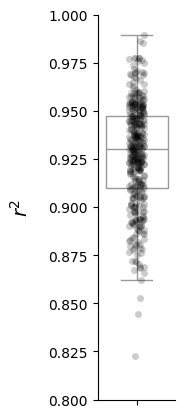

,r_squared
count,400.000000
mean,0.927126
std,0.026913
min,0.822572
25%,0.909812
50%,0.930033
75%,0.947136
max,0.989533


In [18]:
fig, ax = plt.subplots(figsize=(1, 5))
sns.stripplot(fit_df['r_squared'], color='k', alpha=0.2)
sns.boxplot(fit_df['r_squared'], color='w', showfliers=False)
sns.despine(top=True, right=True)
plt.ylabel(r"$r^2$", fontsize=14, labelpad=12)
plt.ylim(0.8, 1)
plt.show()

fit_df['r_squared'].describe()

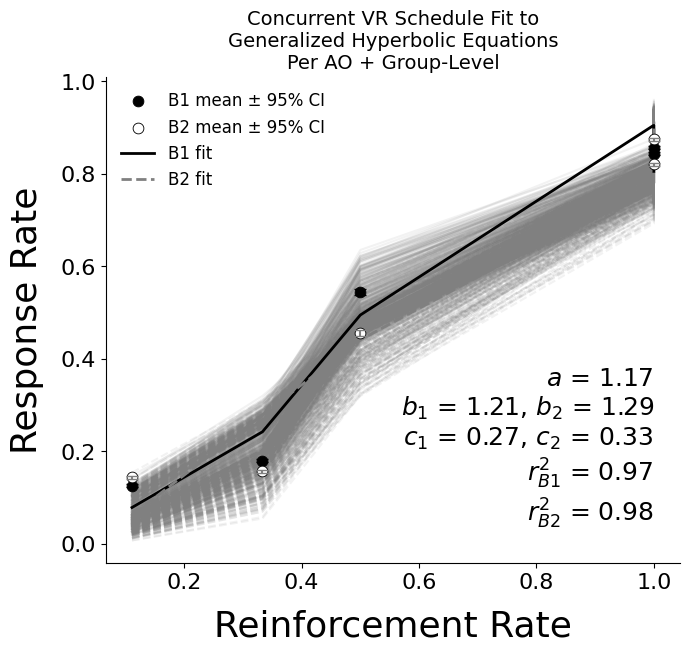

In [19]:
from scipy.optimize import least_squares
from sklearn.metrics import r2_score
from scipy.stats import sem, t
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define McDowell concurrent schedule equations
def B1_eq(r1, r2, a, b1, c1, c2):
    return (b1 * (r1 ** a)) / (r1 ** a + (c1 / c2) * (r2 ** a) + c1)

def B2_eq(r1, r2, a, b2, c1, c2):
    return (b2 * (r2 ** a)) / ((c2 / c1) * (r1 ** a) + (r2 ** a) + c2)

# Joint residual function for least squares
def joint_residuals(params, r1, r2, B1_obs, B2_obs):
    a, b1, b2, c1, c2 = params
    B1_pred = B1_eq(r1, r2, a, b1, c1, c2)
    B2_pred = B2_eq(r1, r2, a, b2, c1, c2)
    return np.concatenate([(B1_pred - B1_obs), (B2_pred - B2_obs)])

# Prepare data
results_df = results_concurrent_df.copy()
results_df['r1'] = 1 / results_df['VR1']
results_df['r2'] = 1 / results_df['VR2']

# Fit per AO
fit_results = []
ao_fits = []

for ao_id, group in results_df.groupby("AO_id"):
    if group.shape[0] < 5:
        continue
    try:
        x0 = [1.0, 1.0, 1.0, 0.1, 0.1]
        res = least_squares(
            joint_residuals,
            x0=x0,
            bounds=(0, np.inf),
            args=(group['r1'].values, group['r2'].values, group['choice1_avg'].values, group['choice2_avg'].values)
        )
        a, b1, b2, c1, c2 = res.x

        # Compute predictions and R²
        B1_pred = B1_eq(group['r1'], group['r2'], a, b1, c1, c2)
        B2_pred = B2_eq(group['r1'], group['r2'], a, b2, c1, c2)
        r2_B1 = r2_score(group['choice1_avg'], B1_pred)
        r2_B2 = r2_score(group['choice2_avg'], B2_pred)

        fit_results.append({
            'AO_id': ao_id,
            'a': a, 'b1': b1, 'b2': b2, 'c1': c1, 'c2': c2,
            'r2_B1': r2_B1, 'r2_B2': r2_B2
        })

        ao_fits.append({
            'AO_id': ao_id,
            'r1': group['r1'].values,
            'r2': group['r2'].values,
            'B1_pred': B1_pred,
            'B2_pred': B2_pred
        })
    except:
        continue

fit_df = pd.DataFrame(fit_results)

# Group means and CI
grouped = results_df.groupby(['VR1', 'VR2']).agg({
    'r1': 'mean',
    'r2': 'mean',
    'choice1_avg': ['mean', sem],
    'choice2_avg': ['mean', sem]
}).reset_index()

grouped.columns = ['VR1', 'VR2', 'r1', 'r2', 'B1_mean', 'B1_se', 'B2_mean', 'B2_se']
grouped['B1_ci'] = grouped['B1_se'] * t.ppf(0.975, df=len(results_df) - 1)
grouped['B2_ci'] = grouped['B2_se'] * t.ppf(0.975, df=len(results_df) - 1)

# Fit model to group means
x0 = [1.0, 1.0, 1.0, 0.1, 0.1]
res = least_squares(
    joint_residuals,
    x0=x0,
    bounds=(0, np.inf),
    args=(grouped['r1'].values, grouped['r2'].values, grouped['B1_mean'].values, grouped['B2_mean'].values)
)
a, b1, b2, c1, c2 = res.x

grouped['B1_pred'] = B1_eq(grouped['r1'], grouped['r2'], a, b1, c1, c2)
grouped['B2_pred'] = B2_eq(grouped['r1'], grouped['r2'], a, b2, c1, c2)

r2_B1 = r2_score(grouped['B1_mean'], grouped['B1_pred'])
r2_B2 = r2_score(grouped['B2_mean'], grouped['B2_pred'])

# Plot
plt.figure(figsize=(7, 6))

# All AO lines in gray
for fit in ao_fits:
    plt.plot(fit['r1'], fit['B1_pred'], color='gray', alpha=0.1, zorder=1)
    plt.plot(fit['r2'], fit['B2_pred'], color='gray', alpha=0.1, linestyle='--', zorder=1)

# Mean data points with CI
sns.scatterplot(x=grouped['r1'], y=grouped['B1_mean'], color='black', edgecolor='black', s=60,
                label='B1 mean ± 95% CI', zorder=10)
plt.errorbar(grouped['r1'], grouped['B1_mean'], yerr=grouped['B1_ci'], fmt='none',
             ecolor='black', capsize=4, zorder=10)

sns.scatterplot(x=grouped['r2'], y=grouped['B2_mean'], color='white', edgecolor='black', s=60,
                label='B2 mean ± 95% CI', zorder=10)
plt.errorbar(grouped['r2'], grouped['B2_mean'], yerr=grouped['B2_ci'], fmt='none',
             ecolor='gray', capsize=4, zorder=10)

# Group fits in bold
plt.plot(grouped['r1'], grouped['B1_pred'], color='black', linewidth=2,
         label='B1 fit', zorder=9)
plt.plot(grouped['r2'], grouped['B2_pred'], color='gray', linewidth=2, linestyle='--',
         label='B2 fit', zorder=9)

# Annotation
plt.text(
    1, 0.05,
    f"$a$ = {a:.2f}\n"
    f"$b_1$ = {b1:.2f}, $b_2$ = {b2:.2f}\n"
    f"$c_1$ = {c1:.2f}, $c_2$ = {c2:.2f}\n"
    f"$r^2_{{B1}}$ = {r2_B1:.2f}\n"
    f"$r^2_{{B2}}$ = {r2_B2:.2f}",
    fontsize=18,
    ha='right'
)

plt.xlabel('Reinforcement Rate', fontsize=26, labelpad=12)
plt.ylabel('Response Rate', fontsize=26, labelpad=12)
plt.yticks(fontsize=16)
plt.xticks(fontsize=16)
plt.legend(frameon=False, fontsize=12)
sns.despine(top=True, right=True)
plt.tight_layout()
plt.title('Concurrent VR Schedule Fit to\nGeneralized Hyperbolic Equations\nPer AO + Group-Level', fontsize=14)
plt.show()


In [20]:
# Prepare data for concurrent schedule version of the same 4x4 grid plot
params = ['activation', 'delta', 'alpha', 'eta']

# Mapping for each lever's metrics
metrics_concurrent_1 = {
    'arousal1_avg': (r'Arousal ($\it{B}_{1}$)', 'arousal1_ci'),
    'coupling1_avg': (r'Coupling ($\it{B}_{1}$)', 'coupling1_ci'),
    'choice1_avg': (r'Choice Rate ($\it{B}_{1}$)', 'choice1_ci'),
}

metrics_concurrent_2 = {
    'arousal2_avg': (r'Arousal ($\it{B}_{2}$)', 'arousal2_ci'),
    'coupling2_avg': (r'Coupling ($\it{B}_{2}$)', 'coupling2_ci'),
    'choice2_avg': (r'Choice Rate ($\it{B}_{2}$)', 'choice2_ci'),
}

In [21]:
# Create subplot function
def plot_concurrent_grid(df, metrics, title):
    fig, axs = plt.subplots(3, 4, figsize=(16, 14), sharex='col', sharey=False)
    fig.subplots_adjust(hspace=0.4, wspace=0.4)

    for row_idx, (metric_col, (metric_label, ci_col)) in enumerate(metrics.items()):
        for col_idx, param in enumerate(params):
            ax = axs[row_idx, col_idx]
            if metric_col == '':  # Skip empty row
                ax.axis('off')
                continue

            sub_df = df[[param, metric_col, ci_col]].copy()
            sub_df['x_val'] = pd.Categorical(sub_df[param]).codes
            x_jittered = sub_df['x_val'] + np.random.uniform(-0.2, 0.2, size=len(sub_df))

            ax.scatter(x_jittered, sub_df[metric_col], color='black', alpha=0.7, s=15, zorder=2)
            ax.errorbar(
                x_jittered,
                sub_df[metric_col],
                yerr=sub_df[ci_col],
                fmt='none',
                ecolor='gray',
                elinewidth=0.8,
                capsize=2,
                alpha=0.6,
                zorder=1
            )

            # Add symbolic labels
            param_symbols = {
                'activation': 'Activation',
                'delta': r'$\delta$',
                'alpha': r'$\alpha$',
                'eta': r'$\eta$'
            }

            # Format axes
            if row_idx == 2:
                ax.set_xlabel(param_symbols[param], fontsize=20, labelpad=8, color='k')
                ax.set_xticks(range(len(sub_df[param].unique())))
                ax.set_xticklabels(sorted(sub_df[param].unique()), fontsize=10, color='k')
            else:
                ax.set_xlabel("")
                ax.set_xticklabels([])
                ax.tick_params(labelbottom=False)

            if col_idx == 0:
                ax.set_ylabel(metric_label, fontsize=20, labelpad=8, color='k')
            else:
                ax.set_ylabel("")
                ax.set_yticklabels([])

            ax.grid(False)
            sns.despine(top=True, right=True)

    plt.suptitle(title, fontsize=30)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

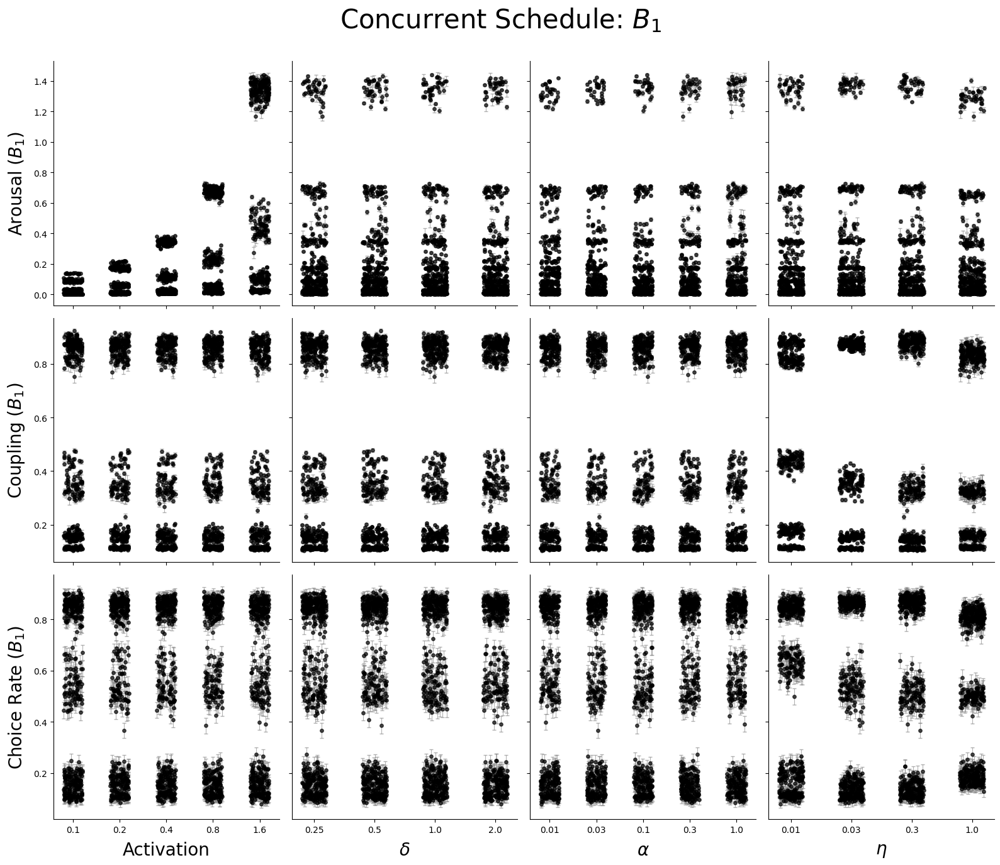

In [22]:
# Plot Lever 1
plot_concurrent_grid(results_concurrent_df, metrics_concurrent_1, r"Concurrent Schedule: $\it{B}_{1}$")

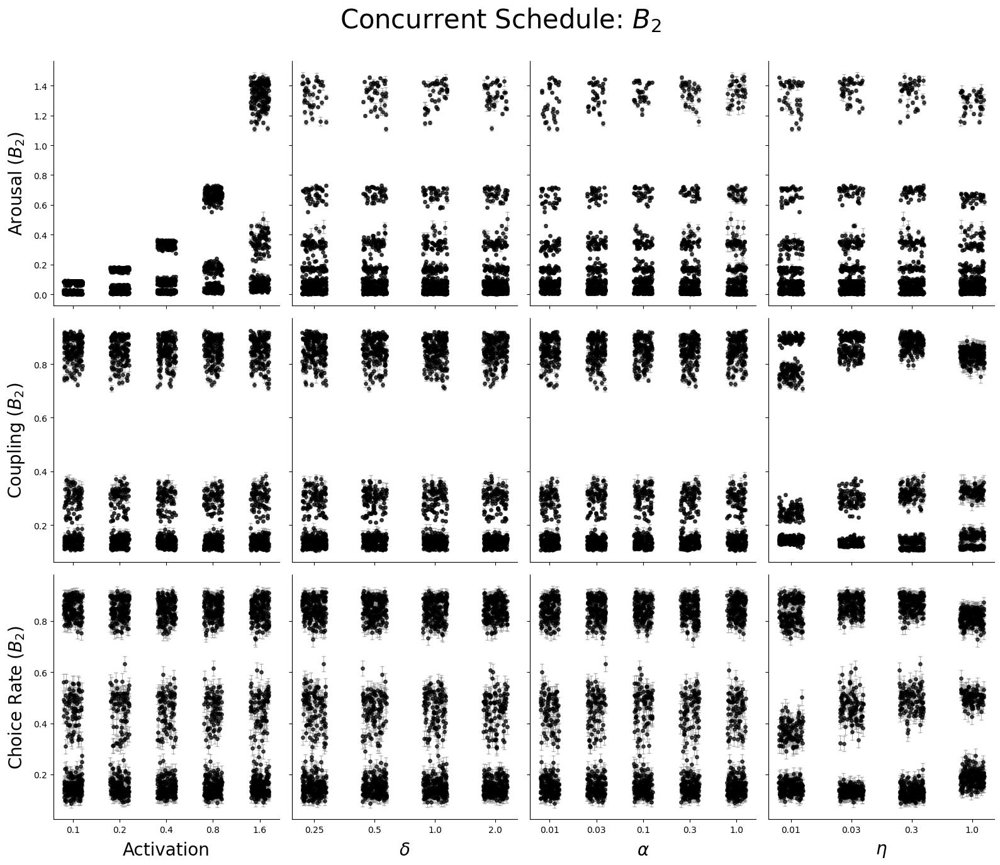

In [23]:
# Plot Lever 2
plot_concurrent_grid(results_concurrent_df, metrics_concurrent_2, r"Concurrent Schedule: $\it{B}_{2}$")

# A Range of Concurrent VIs

In [24]:
import numpy as np
import pandas as pd
from itertools import product
from scipy.stats import sem, t
from tqdm import tqdm

# --- MPR Model Equations ---
def update_arousal(prev_arousal, reinforcement, alpha, a):
    return alpha * (a * reinforcement) + (1 - alpha) * prev_arousal

def compute_total_response_rate(A, delta):
    return (1 / delta) * (A / (1 + A))

def compute_target_response_rate(A, delta, coupling):
    return coupling * (1 / delta) * (A / (1 + A))

def update_coupling(prev_coupling, was_reinforced, learning_rate, proximity=1.0):
    target = proximity if was_reinforced else 0.1
    return prev_coupling + learning_rate * (target - prev_coupling)

def update_step(prev_arousal, prev_coupling, reinforcement, a, delta, alpha, eta):
    A = update_arousal(prev_arousal, reinforcement, alpha, a)
    C = update_coupling(prev_coupling, bool(reinforcement), eta)
    b_total = compute_total_response_rate(A, delta)
    b_target = compute_target_response_rate(A, delta, C)
    return A, C, b_total, b_target

# --- Concurrent VI Sequence Simulation (AO across all VI pairs) ---
def simulate_concurrent_mpr_vi_sequence(vi_pairs, a, delta, alpha, eta, ao_id, num_steps=1000, avg_peck_rate=2.5):
    A1, C1 = 0.6, 0.5
    A2, C2 = 0.6, 0.5
    results = []

    for pair_index, (vi1, vi2) in enumerate(vi_pairs):
        A1_hist, A2_hist, C1_hist, C2_hist = [], [], [], []
        b1_hist, b2_hist = [], []

        avg_irt = 1.0 / avg_peck_rate
        vi_times1 = np.cumsum(np.random.exponential(scale=vi1, size=num_steps))
        vi_times2 = np.cumsum(np.random.exponential(scale=vi2, size=num_steps))
        t1_index, t2_index = 0, 0
        next_r1, next_r2 = vi_times1[0], vi_times2[0]
        current_time = 0

        for _ in range(num_steps):
            current_time += avg_irt
            r1 = int(current_time >= next_r1)
            r2 = int(current_time >= next_r2)

            if r1 and t1_index + 1 < len(vi_times1):
                t1_index += 1
                next_r1 = vi_times1[t1_index]
            if r2 and t2_index + 1 < len(vi_times2):
                t2_index += 1
                next_r2 = vi_times2[t2_index]

            # Choice
            p1 = C1 / (C1 + C2)
            choice = np.random.choice([1, 2], p=[p1, 1 - p1])

            if choice == 1:
                A1, C1, _, _ = update_step(A1, C1, r1, a, delta, alpha, eta)
                A2, C2 = update_arousal(A2, 0, alpha, a), update_coupling(C2, False, eta)
                b1_hist.append(1)
                b2_hist.append(0)
            else:
                A2, C2, _, _ = update_step(A2, C2, r2, a, delta, alpha, eta)
                A1, C1 = update_arousal(A1, 0, alpha, a), update_coupling(C1, False, eta)
                b1_hist.append(0)
                b2_hist.append(1)

            A1_hist.append(A1)
            A2_hist.append(A2)
            C1_hist.append(C1)
            C2_hist.append(C2)

        def ci95(data):
            return sem(data) * t.ppf(0.975, len(data) - 1)

        results.append({
            'AO_id': ao_id,
            'pair_index': pair_index,
            'VI1': vi1,
            'VI2': vi2,
            'reinforcement_ratio': round(vi2 / vi1, 2),
            'arousal1_avg': np.mean(A1_hist),
            'arousal2_avg': np.mean(A2_hist),
            'coupling1_avg': np.mean(C1_hist),
            'coupling2_avg': np.mean(C2_hist),
            'choice1_avg': np.mean(b1_hist),
            'choice2_avg': np.mean(b2_hist),
            'arousal1_ci': ci95(A1_hist),
            'arousal2_ci': ci95(A2_hist),
            'coupling1_ci': ci95(C1_hist),
            'coupling2_ci': ci95(C2_hist),
            'choice1_ci': ci95(b1_hist),
            'choice2_ci': ci95(b2_hist),
            'activation': a,
            'delta': delta,
            'alpha': alpha,
            'eta': eta
        })

    return results

# Params
deltas = [0.25, 0.50, 1.0, 2.0]
activations = [0.1, 0.2, 0.4, 0.8, 1.6]
alphas = [0.01, 0.03, 0.1, 0.3, 1.0]
etas = [0.01, 0.03, 0.3, 1.0]
vi_pairs = [(1, 9), (1, 3), (2, 2), (3, 1), (9, 1)]

# Simulation
results_concurrent_vi = []
grid = list(product(activations, deltas, alphas, etas))

for ao_id, (a, delta, alpha, eta) in enumerate(tqdm(grid, desc="Concurrent VI AO sims")):
    shuffled_pairs = np.random.permutation(vi_pairs)
    result = simulate_concurrent_mpr_vi_sequence(shuffled_pairs, a, delta, alpha, eta, ao_id=ao_id)
    results_concurrent_vi.extend(result)

# Final DataFrame
results_concurrent_vi_df = pd.DataFrame(results_concurrent_vi)

Concurrent VI AO sims: 100%|██████████| 400/400 [01:02<00:00,  6.41it/s]


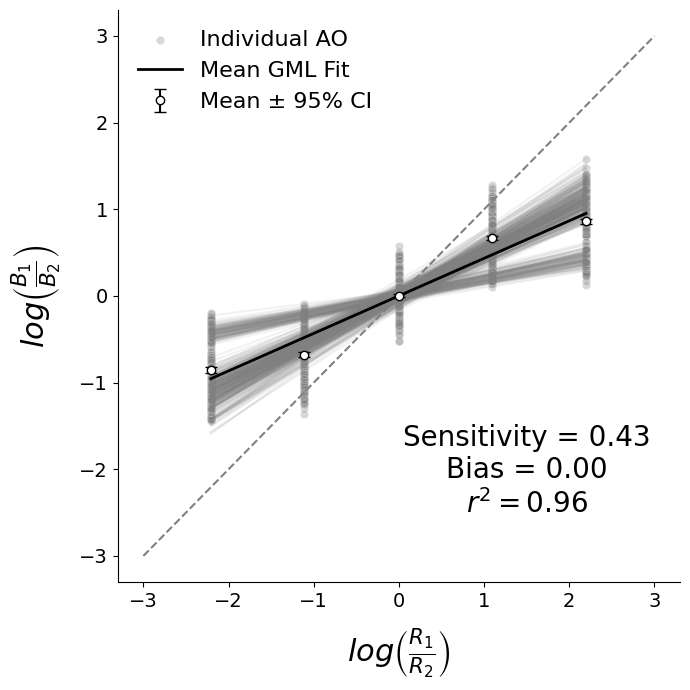

In [25]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from scipy.stats import sem, t

# Step 1: Calculate log ratios
results_concurrent_vi_df['response_ratio'] = results_concurrent_vi_df['choice1_avg'] / results_concurrent_vi_df['choice2_avg']
results_concurrent_vi_df['log_resp_ratio'] = np.log(results_concurrent_vi_df['response_ratio'])
results_concurrent_vi_df['log_reinf_ratio'] = np.log(results_concurrent_vi_df['reinforcement_ratio'])

# Step 2: Fit matching law per AO
ao_fits = []
ao_lines = []

for ao_id, group in results_concurrent_vi_df.groupby("AO_id"):
    if group['log_reinf_ratio'].nunique() < 2:
        continue
    X = group[['log_reinf_ratio']]
    y = group['log_resp_ratio']
    model = LinearRegression().fit(X, y)
    slope = model.coef_[0]
    intercept = model.intercept_
    r2 = r2_score(y, model.predict(X))

    ao_fits.append({'AO_id': ao_id, 'slope': slope, 'intercept': intercept, 'r_squared': r2})

    x_range = np.linspace(X.min(), X.max(), 100)
    ao_lines.append(pd.DataFrame({
        'AO_id': ao_id,
        'x': x_range.squeeze(),
        'y': model.predict(pd.DataFrame({'log_reinf_ratio': x_range.squeeze()}))
    }))

fit_df = pd.DataFrame(ao_fits)
ao_lines_df = pd.concat(ao_lines)

# Step 3: Group-level mean + CI
grouped_means = results_concurrent_vi_df.groupby(['VI1', 'VI2', 'reinforcement_ratio']).agg(
    log_resp_ratio_mean=('log_resp_ratio', 'mean'),
    log_resp_ratio_se=('log_resp_ratio', sem),
    log_reinf_ratio=('log_reinf_ratio', 'mean')
).reset_index()

grouped_means['log_resp_ratio_ci'] = grouped_means['log_resp_ratio_se'] * t.ppf(0.975, df=len(results_concurrent_vi_df) - 1)

# Step 4: Fit group-level GML
X_group = grouped_means[['log_reinf_ratio']]
y_group = grouped_means['log_resp_ratio_mean']
model_group = LinearRegression().fit(X_group, y_group)
slope = model_group.coef_[0]
intercept = model_group.intercept_
r2 = r2_score(y_group, model_group.predict(X_group))

x_range_group = np.linspace(X_group.min(), X_group.max(), 100)
y_pred_group = model_group.predict(pd.DataFrame({'log_reinf_ratio': x_range_group.squeeze()}))

# Step 5: Plot
plt.figure(figsize=(7, 7))

# Individual AO data and fits
sns.scatterplot(
    x='log_reinf_ratio',
    y='log_resp_ratio',
    data=results_concurrent_vi_df,
    color='gray',
    alpha=0.3,
    label='Individual AO',
    zorder=1
)

for _, ao_line in ao_lines_df.groupby('AO_id'):
    plt.plot(ao_line['x'], ao_line['y'], color='gray', alpha=0.1, zorder=1)

# Group means with CI
plt.errorbar(
    x=grouped_means['log_reinf_ratio'],
    y=grouped_means['log_resp_ratio_mean'],
    yerr=grouped_means['log_resp_ratio_ci'],
    fmt='o',
    color='white',
    markersize=6,
    elinewidth=1.5,
    ecolor='black',
    capsize=4,
    markeredgecolor='black',
    label='Mean ± 95% CI',
    zorder=10
)

# Group-level GML line
plt.plot(x_range_group, y_pred_group, color='black', linewidth=2, label='Mean GML Fit', zorder=9)
plt.plot([-3, 3], [-3, 3], linestyle='--', color='gray', zorder=1)

# Labels and annotation
plt.xlabel(r'$\mathit{log}\left(\frac{R_1}{R_2}\right)$', fontsize=22, labelpad=12)
plt.ylabel(r'$\mathit{log}\left(\frac{B_1}{B_2}\right)$', fontsize=22, labelpad=12)

plt.text(
    1.5, -2.5,
    f"Sensitivity = {slope:.2f}\nBias = {intercept:.2f}\n$r^2 = {r2:.2f}$",
    fontsize=20,
    ha='center'
)

plt.grid(False)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(frameon=False, fontsize=16)
sns.despine(top=True, right=True)
plt.tight_layout()
plt.show()


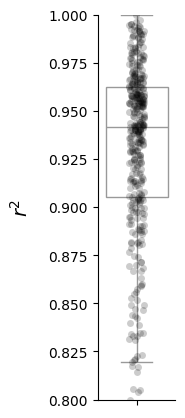

,r_squared
count,400.000000
mean,0.929968
std,0.047380
min,0.692368
25%,0.904959
50%,0.941540
75%,0.962126
max,0.999509


In [26]:
fig, ax = plt.subplots(figsize=(1, 5))
sns.stripplot(fit_df['r_squared'], color='k', alpha=0.2)
sns.boxplot(fit_df['r_squared'], color='w', showfliers=False)
sns.despine(top=True, right=True)
plt.ylabel(r"$r^2$", fontsize=14, labelpad=12)
plt.ylim(0.8, 1)
plt.show()

fit_df['r_squared'].describe()

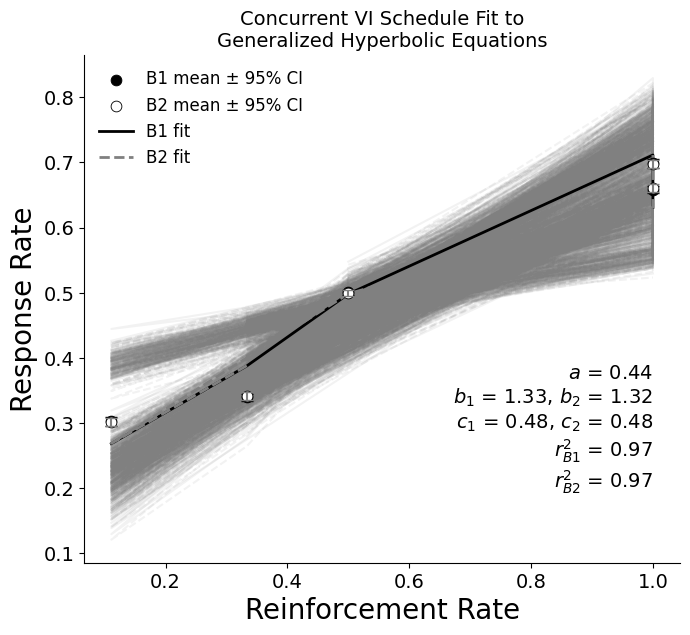

In [27]:
from scipy.optimize import least_squares
from sklearn.metrics import r2_score
from scipy.stats import sem, t
import matplotlib.pyplot as plt
import seaborn as sns

# --- McDowell equations ---
def B1_eq(r1, r2, a, b1, c1, c2):
    return (b1 * (r1 ** a)) / (r1 ** a + (c1 / c2) * (r2 ** a) + c1)

def B2_eq(r1, r2, a, b2, c1, c2):
    return (b2 * (r2 ** a)) / ((c2 / c1) * (r1 ** a) + (r2 ** a) + c2)

def joint_residuals(params, r1, r2, B1_obs, B2_obs):
    a, b1, b2, c1, c2 = params
    B1_pred = B1_eq(r1, r2, a, b1, c1, c2)
    B2_pred = B2_eq(r1, r2, a, b2, c1, c2)
    return np.concatenate([(B1_pred - B1_obs), (B2_pred - B2_obs)])

results_df = results_concurrent_vi_df.copy()
results_df['r1'] = 1 / results_df['VI1']
results_df['r2'] = 1 / results_df['VI2']

fit_results = []
ao_fits = []

for ao_id, group in results_df.groupby("AO_id"):
    if group.shape[0] < 5:
        continue
    try:
        x0 = [1.0, 1.0, 1.0, 0.1, 0.1]
        res = least_squares(
            joint_residuals,
            x0=x0,
            bounds=(0, np.inf),
            args=(group['r1'].values, group['r2'].values,
                  group['choice1_avg'].values, group['choice2_avg'].values)
        )
        a, b1, b2, c1, c2 = res.x

        B1_pred = B1_eq(group['r1'], group['r2'], a, b1, c1, c2)
        B2_pred = B2_eq(group['r1'], group['r2'], a, b2, c1, c2)
        r2_B1 = r2_score(group['choice1_avg'], B1_pred)
        r2_B2 = r2_score(group['choice2_avg'], B2_pred)

        fit_results.append({
            'AO_id': ao_id,
            'a': a, 'b1': b1, 'b2': b2,
            'c1': c1, 'c2': c2,
            'r2_B1': r2_B1,
            'r2_B2': r2_B2
        })

        ao_fits.append(pd.DataFrame({
            'AO_id': ao_id,
            'r1': group['r1'].values,
            'r2': group['r2'].values,
            'B1_pred': B1_pred,
            'B2_pred': B2_pred
        }))
    except:
        continue

fit_df = pd.DataFrame(fit_results)
ao_fits_df = pd.concat(ao_fits)

grouped = results_df.groupby(['VI1', 'VI2']).agg({
    'r1': 'mean',
    'r2': 'mean',
    'choice1_avg': ['mean', sem],
    'choice2_avg': ['mean', sem]
}).reset_index()

grouped.columns = ['VI1', 'VI2', 'r1', 'r2', 'B1_mean', 'B1_se', 'B2_mean', 'B2_se']
grouped['B1_ci'] = grouped['B1_se'] * t.ppf(0.975, df=len(results_df)-1)
grouped['B2_ci'] = grouped['B2_se'] * t.ppf(0.975, df=len(results_df)-1)

# Fit to group means
x0 = [1.0, 1.0, 1.0, 0.1, 0.1]
res = least_squares(
    joint_residuals,
    x0=x0,
    bounds=(0, np.inf),
    args=(grouped['r1'].values, grouped['r2'].values,
          grouped['B1_mean'].values, grouped['B2_mean'].values)
)
a, b1, b2, c1, c2 = res.x

grouped['B1_pred'] = B1_eq(grouped['r1'], grouped['r2'], a, b1, c1, c2)
grouped['B2_pred'] = B2_eq(grouped['r1'], grouped['r2'], a, b2, c1, c2)

r2_B1 = r2_score(grouped['B1_mean'], grouped['B1_pred'])
r2_B2 = r2_score(grouped['B2_mean'], grouped['B2_pred'])

plt.figure(figsize=(7, 6))

# Individual AO fits (gray)
for ao_id, ao_data in ao_fits_df.groupby('AO_id'):
    plt.plot(ao_data['r1'], ao_data['B1_pred'], color='gray', alpha=0.1, zorder=1)
    plt.plot(ao_data['r2'], ao_data['B2_pred'], color='gray', alpha=0.1, linestyle='--', zorder=1)

# Group means
sns.scatterplot(x=grouped['r1'], y=grouped['B1_mean'],
                color='black', edgecolor='black', s=60,
                label='B1 mean ± 95% CI', zorder=10)
plt.errorbar(grouped['r1'], grouped['B1_mean'], yerr=grouped['B1_ci'],
             fmt='none', ecolor='black', capsize=4, zorder=10)

sns.scatterplot(x=grouped['r2'], y=grouped['B2_mean'],
                color='white', edgecolor='black', s=60,
                label='B2 mean ± 95% CI', zorder=10)
plt.errorbar(grouped['r2'], grouped['B2_mean'], yerr=grouped['B2_ci'],
             fmt='none', ecolor='gray', capsize=4, zorder=10)

# Group fit lines
plt.plot(grouped['r1'], grouped['B1_pred'], color='black', linewidth=2, label='B1 fit', zorder=9)
plt.plot(grouped['r2'], grouped['B2_pred'], color='gray', linewidth=2, linestyle='--', label='B2 fit', zorder=9)

# Annotation
plt.text(
    1, 0.2,
    f"$a$ = {a:.2f}\n"
    f"$b_1$ = {b1:.2f}, $b_2$ = {b2:.2f}\n"
    f"$c_1$ = {c1:.2f}, $c_2$ = {c2:.2f}\n"
    f"$r^2_{{B1}}$ = {r2_B1:.2f}\n"
    f"$r^2_{{B2}}$ = {r2_B2:.2f}",
    fontsize=14,
    ha='right'
)

plt.xlabel('Reinforcement Rate', fontsize=20)
plt.ylabel('Response Rate', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(frameon=False, fontsize=12)
sns.despine(top=True, right=True)
plt.tight_layout()
plt.title('Concurrent VI Schedule Fit to\nGeneralized Hyperbolic Equations', fontsize=14)
plt.show()


In [28]:
# Prepare data for concurrent schedule version of the same 4x4 grid plot
params = ['activation', 'delta', 'alpha', 'eta']

# Mapping for each lever's metrics
metrics_concurrent_1 = {
    'arousal1_avg': (r'Arousal ($\it{B}_{1}$)', 'arousal1_ci'),
    'coupling1_avg': (r'Coupling ($\it{B}_{1}$)', 'coupling1_ci'),
    'choice1_avg': (r'Choice Rate ($\it{B}_{1}$)', 'choice1_ci'),
}

metrics_concurrent_2 = {
    'arousal2_avg': (r'Arousal ($\it{B}_{2}$)', 'arousal2_ci'),
    'coupling2_avg': (r'Coupling ($\it{B}_{2}$)', 'coupling2_ci'),
    'choice2_avg': (r'Choice Rate ($\it{B}_{2}$)', 'choice2_ci'),
}

In [29]:
# Create subplot function
def plot_concurrent_grid(df, metrics, title):
    fig, axs = plt.subplots(3, 4, figsize=(16, 14), sharex='col', sharey=False)
    fig.subplots_adjust(hspace=0.4, wspace=0.4)

    for row_idx, (metric_col, (metric_label, ci_col)) in enumerate(metrics.items()):
        for col_idx, param in enumerate(params):
            ax = axs[row_idx, col_idx]
            if metric_col == '':  # Skip empty row
                ax.axis('off')
                continue

            sub_df = df[[param, metric_col, ci_col]].copy()
            sub_df['x_val'] = pd.Categorical(sub_df[param]).codes
            x_jittered = sub_df['x_val'] + np.random.uniform(-0.2, 0.2, size=len(sub_df))

            ax.scatter(x_jittered, sub_df[metric_col], color='black', alpha=0.7, s=15, zorder=2)
            ax.errorbar(
                x_jittered,
                sub_df[metric_col],
                yerr=sub_df[ci_col],
                fmt='none',
                ecolor='gray',
                elinewidth=0.8,
                capsize=2,
                alpha=0.6,
                zorder=1
            )

            # Add symbolic labels
            param_symbols = {
                'activation': 'Activation',
                'delta': r'$\delta$',
                'alpha': r'$\alpha$',
                'eta': r'$\eta$'
            }

            if row_idx == 2:
                ax.set_xlabel(param_symbols[param], fontsize=20, labelpad=8, color='k')
                ax.set_xticks(range(len(sub_df[param].unique())))
                ax.set_xticklabels(sorted(sub_df[param].unique()), fontsize=10, color='k')
            else:
                ax.set_xlabel("")
                ax.set_xticklabels([])
                ax.tick_params(labelbottom=False)

            if col_idx == 0:
                ax.set_ylabel(metric_label, fontsize=20, labelpad=8, color='k')
            else:
                ax.set_ylabel("")
                ax.set_yticklabels([])

            ax.grid(False)
            sns.despine(top=True, right=True)

    plt.suptitle(title, fontsize=30)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

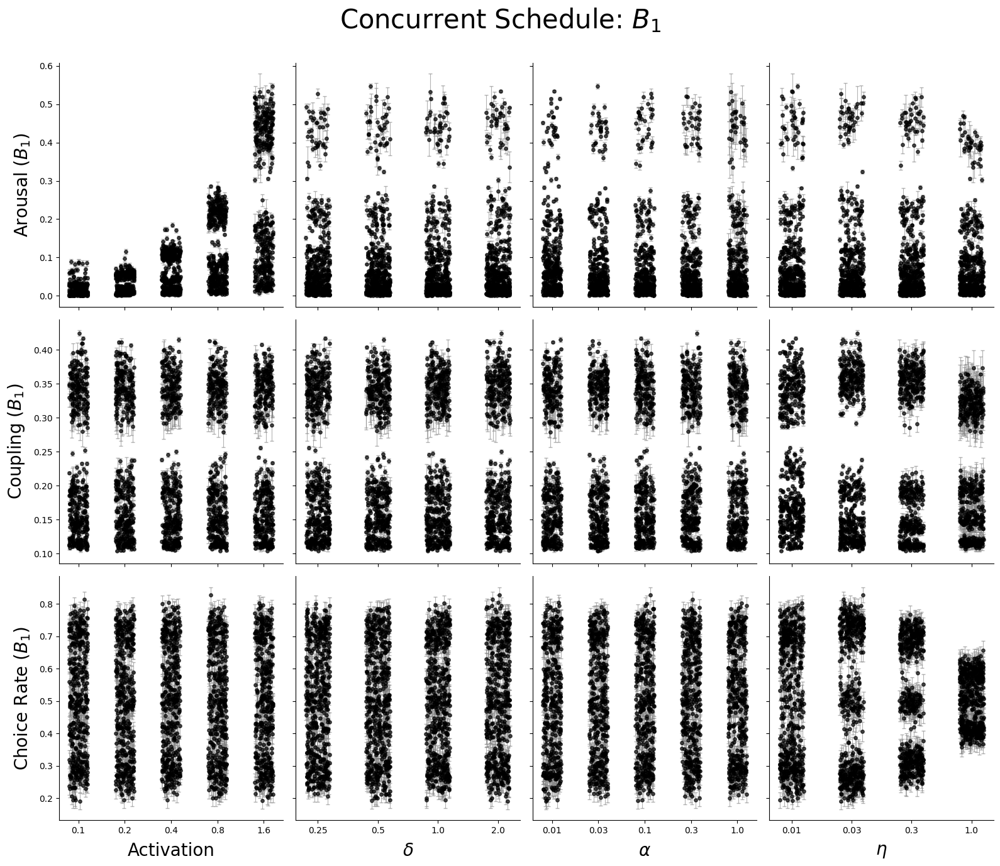

In [30]:
# Plot Lever 1
plot_concurrent_grid(results_concurrent_vi_df, metrics_concurrent_1, r"Concurrent Schedule: $\it{B}_{1}$")

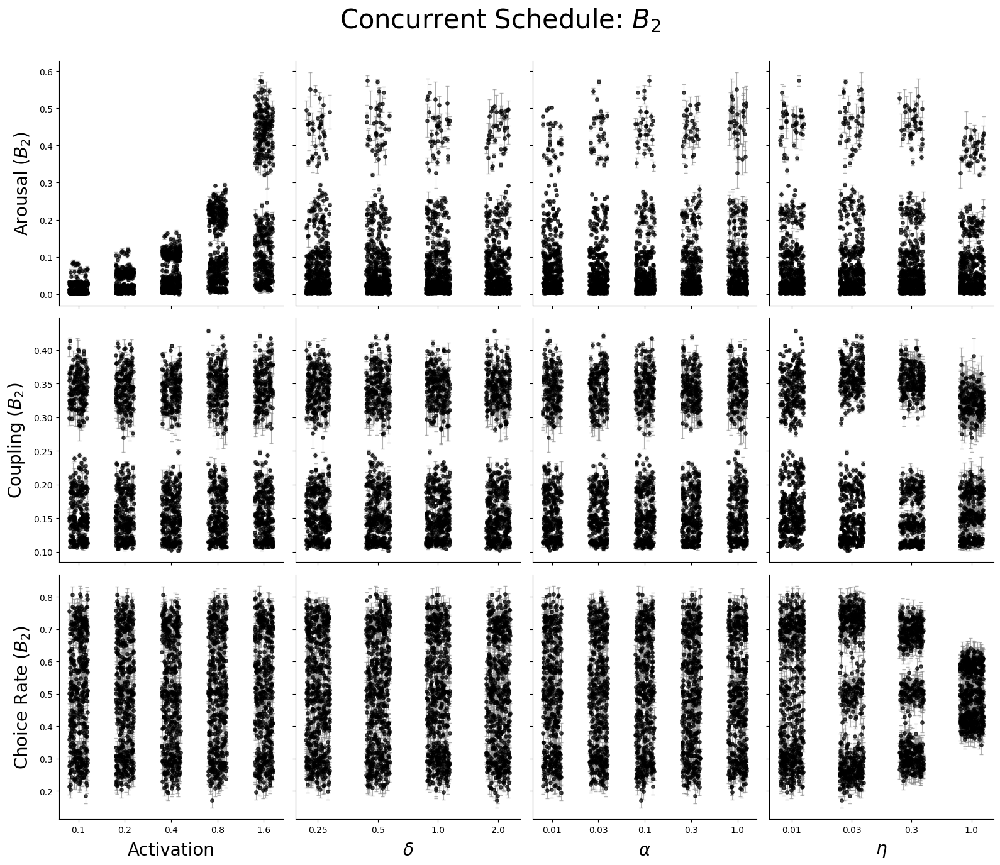

In [31]:
# Plot Lever 2
plot_concurrent_grid(results_concurrent_vi_df, metrics_concurrent_2, r"Concurrent Schedule: $\it{B}_{2}$")